# Big Data Coursework

## Data Processing and Machine Learning in the Cloud 

This is the **INM432 Big Data coursework 2021**. 
This coursework extended elements of **theory** and as well as **practical components** . 

## Code and Report

Your tasks are porting, parallelization, extension, evaluation, and theoretical reflection. 
The **coding tasks** are to be completed in (a copy of) **this notebook**. 
Write your code in the **indicated cells** and **include** the **output** in the submitted notebook.  
Make sure that your **code contains comments** on its **stucture** and explanations of its **purpose**. 

Provide also a **report** with the  **textual answers** as indicated **in a separate PDF document**.  
Include **screenshots** from the Google Cloud web interface (don't use the SCREENSHOT function that Google provides, but just take a picture of the graphs you see for the VMs) and result tables, as well as written text about the analysis. 


## Submission

Download and submit **the notebook** as an **.ipynb** file and also as a **shareable link** to your notebook (**don’t change the online version after submission**). 

Further, provide a **PDF report document** with answers containing text, plots, screenshots and tables. **State the number of words** in the document at the end. The report should **not have more than 2000 words**.  



## Introduction and Description

This part of the coursework focuses on parallelisation and scalability in the cloud with Spark and TesorFlow/Keras. 
We start with code based on **lessons 3 and 4** of the [*Fast and Lean Data Science*](https://github.com/GoogleCloudPlatform/training-data-analyst/tree/master/courses/fast-and-lean-data-science) course by Martin Gorner. 
What we will do here is **parallelise** the **pre-processing** and **machine learning** in the cloud and we will perform **evaluation** and **analysis** on the cloud performance, as well as **theoretical discussion**. 

This coursework contains **4 sections**. Section 0 is only about settings and preparations for cloud computing and has no tasks for you (still read the code and comments). 
Section 1 contains tasks about data pre-processing. 
Sections 2 is about machine learning in the cloud. Section 3 contains the theoretical task for discussion. 


### Section 0

This section just contains some necessary code for setting up the environment.

### Section 1 
Section 1 is about reading image files into a dataset and creating TF Record files. 
We will start with an application of some pre-processing steps to a public “Flowers” dataset (3600 images, 5 classes). 
This is not a vast dataset, but it keeps the tasks more manageable and you can scale up later. 

In the **Getting Started** we will work through the code from *Fast and Lean Data Science*. There no task for you here, but you should work through this code before you do the rest.

In **Task 1** we are going to **measure the speed of reading data** in the cloud and we will **parallelise this in Spark**, using Google Cloud (GC) DataProc in **Task 2**. 
For large amounts of training data, the task of creating the TF Record files benefits from parallelisation, which we will also do in Spark in **Task 3**. 

### Section 2

In Section 2, we will **use  pre-processed data** (the public version of the one prepared in Section 1) to train a **deep neural network** in **Tensorflow 2/Keras**. 
We will use transfer learning to take advantage of existing trained models and reduce the training effort. 

We will use the GC **AI-Platform** (formerly Cloud ML) in **Task 4**. 
In contrast to the GC Compute Engine, we can use  machines with GPUs in AI-Platform with free credits. 

### Section 3

This section is about the theoretical discussion, based on to two papers, in **Task 5**. The answers should be given in the PDF report.

### General points

For **all coding tasks**, take the **time of the operations** and for the cloud operations, get performance **information from the web interfaces** for your reporting and analysis. 

The **tasks** are **mostly independent**. The later tasks can mostly be addressed without needed the solution to the earlier ones.  

# Section 0: Set-up

You need to run the imports and authentication every time you work with this notebook. 
Use the local Spark installation and word count as needed. 

### Imports

We import some packages that we will need throughout.  For the cloud you will need separate import sections, that will need to be partly different from that below. 


In [ ]:
import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time
import string
import random
from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
import pickle
AUTO = tf.data.experimental.AUTOTUNE # used in tf.data.Dataset API

Tensorflow version 2.4.1


### Cloud and Drive authentication

This is for authenticating with Google Drive and with GCS, so that we can create and use our own buckets and access DataProc and AI-Platform. 

This section starts with two interactive authentications.

First, we mount Google Drive for persistent local storage and create a directory `DB-CW2` to use for this work. 
Then we'll set up the cloud environment, including a storage bucket.

In [ ]:
print('Mounting google drive...')
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive"
!mkdir BD-CW
%cd "/content/drive/MyDrive/BD-CW"

Mounting google drive...
Mounted at /content/drive
/content/drive/MyDrive
mkdir: cannot create directory ‘BD-CW’: File exists
/content/drive/MyDrive/BD-CW


Next, we authenticate with the cloud system to enable access to DataProc and AI-Platform.

In [ ]:
import sys
if 'google.colab' in sys.modules:
    from google.colab import auth
    auth.authenticate_user()

It is useful to create a new Google Cloud project for this coursework. You can do this on the [GC Console page](https://console.cloud.google.com) by clicking on the entry at the top, right of the *Google Cloud Platform* and choosing *New Project*. **Copy** the **generated project ID** to the next cell.

We also specify the **default project and region**. The REGION should be `us-central1` as that seems to be the only one that reliably works with the free credit. 
This way we don't have to specify this information every time we access the cloud.  

In [ ]:
PROJECT = 'sylvan-surf-311408' ### Append -xxxx, where xxxx is your City login ###
### it seems that the project name here has the be all lower case.
!gcloud config set project $PROJECT
REGION = 'us-central1'
!gcloud config set compute/region $REGION
!gcloud config set dataproc/region $REGION

!gcloud config list # show some information

Updated property [core/project].
Updated property [compute/region].
Updated property [dataproc/region].
[component_manager]
disable_update_check = True
[compute]
gce_metadata_read_timeout_sec = 0
region = us-central1
[core]
account = abi.nair42@gmail.com
project = sylvan-surf-311408
[dataproc]
region = us-central1

Your active configuration is: [default]


With the cell below, we **create a storage bucket** that we will use later for **global storage**. 
If the bucket exists you will see a "ServiceException: 409." This is not a problem, just a sign the bucket is already there. 
**You must create your own bucket to have write access.**

In [ ]:
BUCKET = 'gs://{}-storage'.format(PROJECT)
!gsutil mb $BUCKET

Creating gs://sylvan-surf-311408-storage/...
ServiceException: 409 A Cloud Storage bucket named 'sylvan-surf-311408-storage' already exists. Try another name. Bucket names must be globally unique across all Google Cloud projects, including those outside of your organization.


The cell below just **defines some routines for displaying images** that will be **used later**. You can see the code by double-clicking, but you don't need to study this.

In [ ]:
#@title "Display utility functions [RUN THIS TO ACTIVATE]" { display-mode: "form" }
def display_9_images_from_dataset(dataset):
  plt.figure(figsize=(13,13))
  subplot=331
  for i, (image, label) in enumerate(dataset):
    plt.subplot(subplot)
    plt.axis('off')
    plt.imshow(image.numpy().astype(np.uint8))   
    plt.title(str(label.numpy()), fontsize=16)
    # plt.title(label.numpy().decode(), fontsize=16)
    subplot += 1
    if i==8:
      break
  plt.tight_layout()
  plt.subplots_adjust(wspace=0.1, hspace=0.1)
  plt.show()

def display_training_curves(training, validation, title, subplot):
  if subplot%10==1: # set up the subplots on the first call
    plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
    plt.tight_layout()
  ax = plt.subplot(subplot)
  ax.set_facecolor('#F8F8F8')
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['train', 'valid.'])

def dataset_to_numpy_util(dataset, N):
    dataset = dataset.batch(N)
    for images, labels in dataset:
        numpy_images = images.numpy()
        numpy_labels = labels.numpy()
        break;
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
  correct = (label == correct_label)
  return "{} [{}{}{}]".format(CLASSES[label], str(correct), ', shoud be ' if not correct else '',
                              CLASSES[correct_label] if not correct else ''), correct

def display_one_flower(image, title, subplot, red=False):
    plt.subplot(subplot)
    plt.axis('off')
    plt.imshow(image)
    plt.title(title, fontsize=16, color='red' if red else 'black')
    return subplot+1

def display_9_images_with_predictions(images, predictions, labels):
  subplot=331
  plt.figure(figsize=(13,13))
  classes = np.argmax(predictions, axis=-1)
  for i, image in enumerate(images):
    title, correct = title_from_label_and_target(classes[i], labels[i])
    subplot = display_one_flower(image, title, subplot, not correct)
    if i >= 8:
      break;
              
  plt.tight_layout()
  plt.subplots_adjust(wspace=0.1, hspace=0.1)
  plt.show()
  

### Optional: Install Spark locally for quick testing

You can use the cell below to install a local spark as in the labs, to do quicker small-scale interactive testing. Using the cloud is still required for the final version. 


In [ ]:
%cd
!apt-get update -qq
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
#!wget -q https://archive.apache.org/dist/spark/spark-3.0.1/spark-3.0.1-bin-hadoop2.7.tgz
#!tar -xzf spark-3.0.1-bin-hadoop2.7.tgz
!tar -xzf /content/drive/MyDrive/Big_Data/data/spark-3.0.1-bin-hadoop2.7.tgz
!pip install -q findspark
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/root/spark-3.0.1-bin-hadoop2.7"
import findspark
findspark.init()
%cd /content
import pyspark
print(pyspark.__version__)
sc = pyspark.SparkContext.getOrCreate()
print(sc)

/root
/content
3.0.1
<SparkContext master=local[*] appName=pyspark-shell>


# Section 1: Data pre-processing

This section is about the **pre-processing of a dataset** for deep learning with Keras/Tensorflow. 
The tasks are about **parallelisation** and **analysis** the performance of the cloud services. 

## Getting started 

In this section, we get started based on the code from lecture 3 of the 'Fast and Lean Data Science' course to establish the task.


These are some variables with **settings for the *Flowers* dataset**.

In [ ]:
GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
SHARDS = 16 # shards are partitiones into shards
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']
    # labels for the data (folder names)

###Read images and labels

We **read the image files** from a public GCS bucket that contains the *Flowers* dataset. 
**TensorFlow**  has **functions** to process standard **image files**. The `decode_jpeg_and_label` function also extracts the label name from the path. 

In [ ]:
nb_images = len(tf.io.gfile.glob(GCS_PATTERN)) 
shard_size = math.ceil(1.0 * nb_images / SHARDS)
print("Pattern matches {} images which will be rewritten as {} .tfrec files containing {} images each.".format(nb_images, SHARDS, shard_size))

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

filepathDS = tf.data.Dataset.list_files(GCS_PATTERN) # This also shuffles the images
dataset1 = filepathDS.map(decode_jpeg_and_label)
for x in dataset1.take(1):
    print(x) # show what's in a data item

Pattern matches 3670 images which will be rewritten as 16 .tfrec files containing 230 images each.
(<tf.Tensor: shape=(240, 320, 3), dtype=uint8, numpy=
array([[[ 45,  61,  24],
        [ 48,  66,  26],
        [ 51,  69,  27],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 47,  63,  24],
        [ 49,  67,  27],
        [ 51,  69,  27],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[ 50,  66,  27],
        [ 51,  69,  27],
        [ 52,  70,  28],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[ 32,  40,  19],
        [ 33,  37,  20],
        [ 32,  36,  19],
        ...,
        [196, 156, 191],
        [ 29,  44, 129],
        [ 21,  12,  17]],

       [[ 34,  41,  23],
        [ 35,  42,  24],
        [ 37,  42,  22],
        ...,
        [127, 109, 183],
        [  0,  12,  65],
        [ 27,  18,   1]],

       [[

Now we can **have a look** at the images with one of the display functions. Note the **different aspect ratios**.

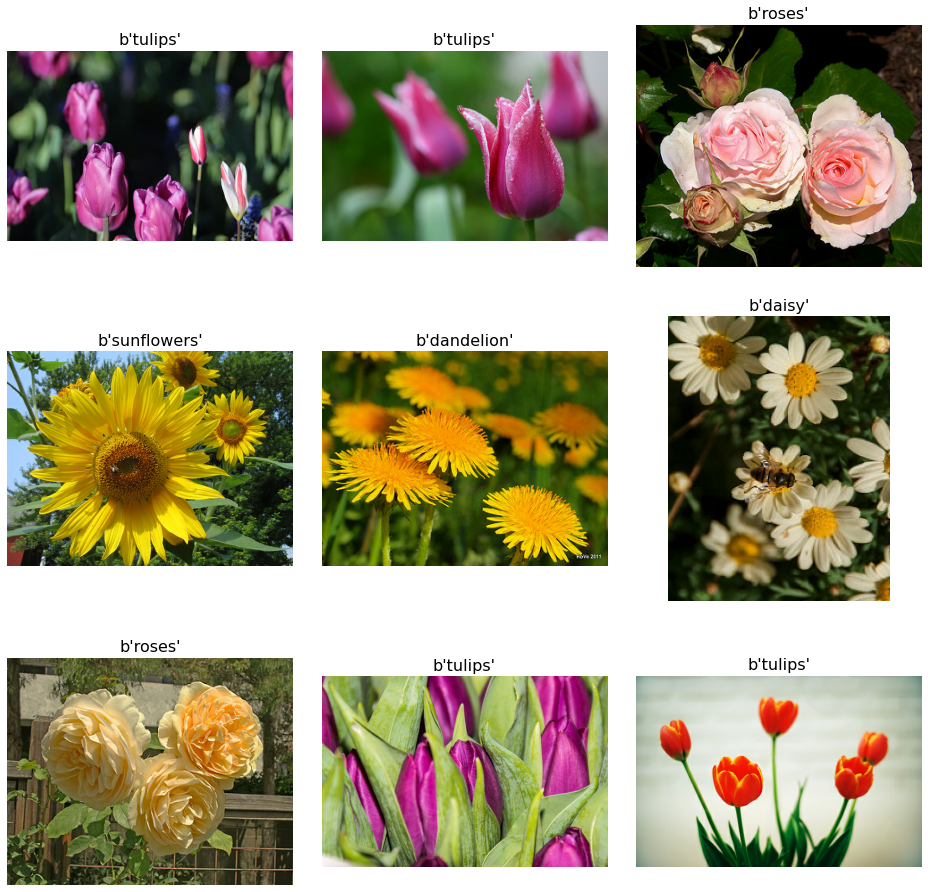

In [ ]:
display_9_images_from_dataset(dataset1)

### Resize and crop images to common size

Standard Neural Networks, like most machine learning algorithms, need **fixed size input items**. 
We achieve this here by resizing and cropping the images to a common target resolution.

In [ ]:
def resize_and_crop_image(image, label):
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label
  
dataset2 = dataset1.map(resize_and_crop_image)  

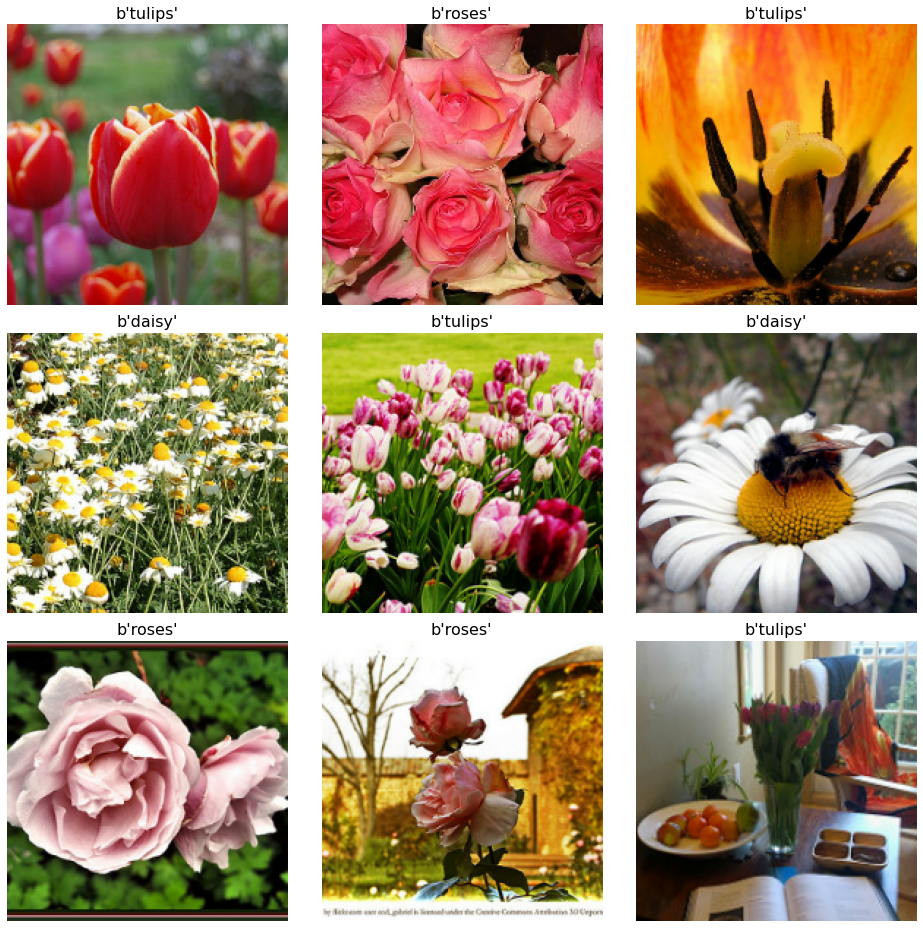

In [ ]:
display_9_images_from_dataset(dataset2)

Now test continuous reading from the dataset.

In [ ]:
batched_dataset = dataset2.batch(8)
sample_set = batched_dataset.take(20)
for image, label in sample_set: 
    print("Image batch shape {}, {})".format(image.numpy().shape,
        [lbl.decode('utf8') for lbl in label.numpy()]))

Image batch shape (8, 192, 192, 3), ['sunflowers', 'roses', 'tulips', 'tulips', 'tulips', 'roses', 'dandelion', 'dandelion'])
Image batch shape (8, 192, 192, 3), ['dandelion', 'roses', 'dandelion', 'sunflowers', 'dandelion', 'daisy', 'tulips', 'dandelion'])
Image batch shape (8, 192, 192, 3), ['tulips', 'tulips', 'daisy', 'sunflowers', 'sunflowers', 'daisy', 'daisy', 'dandelion'])
Image batch shape (8, 192, 192, 3), ['sunflowers', 'roses', 'daisy', 'sunflowers', 'daisy', 'dandelion', 'sunflowers', 'daisy'])
Image batch shape (8, 192, 192, 3), ['sunflowers', 'tulips', 'tulips', 'tulips', 'dandelion', 'sunflowers', 'daisy', 'roses'])
Image batch shape (8, 192, 192, 3), ['dandelion', 'sunflowers', 'daisy', 'sunflowers', 'roses', 'roses', 'tulips', 'tulips'])
Image batch shape (8, 192, 192, 3), ['dandelion', 'daisy', 'dandelion', 'roses', 'roses', 'roses', 'daisy', 'dandelion'])
Image batch shape (8, 192, 192, 3), ['dandelion', 'daisy', 'tulips', 'daisy', 'dandelion', 'dandelion', 'roses',

## Improving Speed 

Using individual image files didn't look very fast. The 'Lean and Fast Data Science' course introduced **two techniques to improve the speed**.


### Recompress the images

By **compressing** the images in the **reduced resolution** we save on the size. 
This **costs some CPU time**, but **saves network and disk bandwith**, especially when the data are **read multiple times**. 


In [ ]:
def recompress_image(image, label):
  height = tf.shape(image)[0]
  width = tf.shape(image)[1]
  image = tf.cast(image, tf.uint8)
  image = tf.image.encode_jpeg(image, optimize_size=True, chroma_downsampling=False)
  return image, label, height, width

dataset3 = dataset2.map(recompress_image)
dataset4 = dataset3.batch(shard_size) # sharding: there will be one "batch" of images per file 

In [ ]:
# This is a quick test to get an idea how long recompressions takes.  
BATCH_SIZE = 8
dataset4 = dataset3.batch(BATCH_SIZE)
BATCH_NUMBER = 3 # number of batches
test_set = dataset4.take(BATCH_NUMBER)
for image, label, height, width in test_set:
    print("Image batch shape {}, {})".format(image.numpy().shape, [lbl.decode('utf8') for lbl in label.numpy()])) 

Image batch shape (8,), ['sunflowers', 'dandelion', 'tulips', 'dandelion', 'sunflowers', 'dandelion', 'roses', 'roses'])
Image batch shape (8,), ['dandelion', 'sunflowers', 'daisy', 'tulips', 'sunflowers', 'sunflowers', 'tulips', 'roses'])
Image batch shape (8,), ['daisy', 'dandelion', 'dandelion', 'sunflowers', 'tulips', 'dandelion', 'dandelion', 'tulips'])


### Write the dataset to TFRecord files

By writing **multiple samples into a single file**, we can make further speed gains.

There are **ready-made pre-processed data** versions available, e.g. here: 
`gs://flowers-public/tfrecords-jpeg-192x192-2/`, that we can use for comparison and later use.

First we need to **define a location** where we want to put the file. 


In [ ]:
GCS_OUTPUT = BUCKET + '/tfrecords-jpeg-192x192-2/flowers'  # prefix for output file names

Now we can **write the TFRecord files** to the bucket. 

Running the cell takes some time and **only needs to be done once** or not at all, as you can use the publicly available data for the next few cells. 

In [ ]:
# functions for writing TFRecord entries
# Feature values are always stored as lists, a single data element will be a list of size 1
def _bytestring_feature(list_of_bytestrings):
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=list_of_bytestrings))

def _int_feature(list_of_ints): # int64
  return tf.train.Feature(int64_list=tf.train.Int64List(value=list_of_ints))  

def to_tfrecord(tfrec_filewriter, img_bytes, label): #, height, width):  
  class_num = np.argmax(np.array(CLASSES)==label) # 'roses' => 2 (order defined in CLASSES)
  one_hot_class = np.eye(len(CLASSES))[class_num]     # [0, 0, 1, 0, 0] for class #2, roses
  feature = {
      "image": _bytestring_feature([img_bytes]), # one image in the list
      "class": _int_feature([class_num]) #,        # one class in the list
  }
  return tf.train.Example(features=tf.train.Features(feature=feature))
  
print("Writing TFRecords")
tt0 = time.time()
filenames = tf.data.Dataset.list_files(GCS_PATTERN) 
dataset1 = filenames.map(decode_jpeg_and_label)
dataset2 = dataset1.map(resize_and_crop_image)  
dataset3 = dataset2.map(recompress_image)
dataset3 = dataset3.batch(shard_size) # sharding: there will be one "batch" of images per file 
for shard, (image, label, height, width) in enumerate(dataset3):
  # batch size used as shard size here
  shard_size = image.numpy().shape[0]
  # good practice to have the number of records in the filename
  filename = GCS_OUTPUT + "{:02d}-{}.tfrec".format(shard, shard_size)
  # You need to change GCS_OUTPUT to your own bucket to actually create new files  
  with tf.io.TFRecordWriter(filename) as out_file:
    for i in range(shard_size):
      example = to_tfrecord(out_file,
                            image.numpy()[i], # re-compressed image: already a byte string
                            label.numpy()[i] #, height.numpy()[i], width.numpy()[i]
                            )
      out_file.write(example.SerializeToString())
    print("Wrote file {} containing {} records".format(filename, shard_size))
print("Total time: "+str(time.time()-tt0))

Writing TFRecords
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers00-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers01-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers02-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers03-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers04-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers05-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers06-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers07-230.tfrec containing 230 records
Wrote file gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers08-230.tfrec contai

### Test the TFRecord files

We can now **read from the TFRecord files**. By default, we use the files in the public bucket. Comment out the 1st line of the cell below to use the files written in the cell above.

In [ ]:
#GCS_OUTPUT = 'gs://flowers-public/tfrecords-jpeg-192x192-2/' # remove/change to use your own files

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

    
filenames = tf.io.gfile.glob(GCS_OUTPUT + "*.tfrec")
datasetDecoded = load_dataset(filenames)

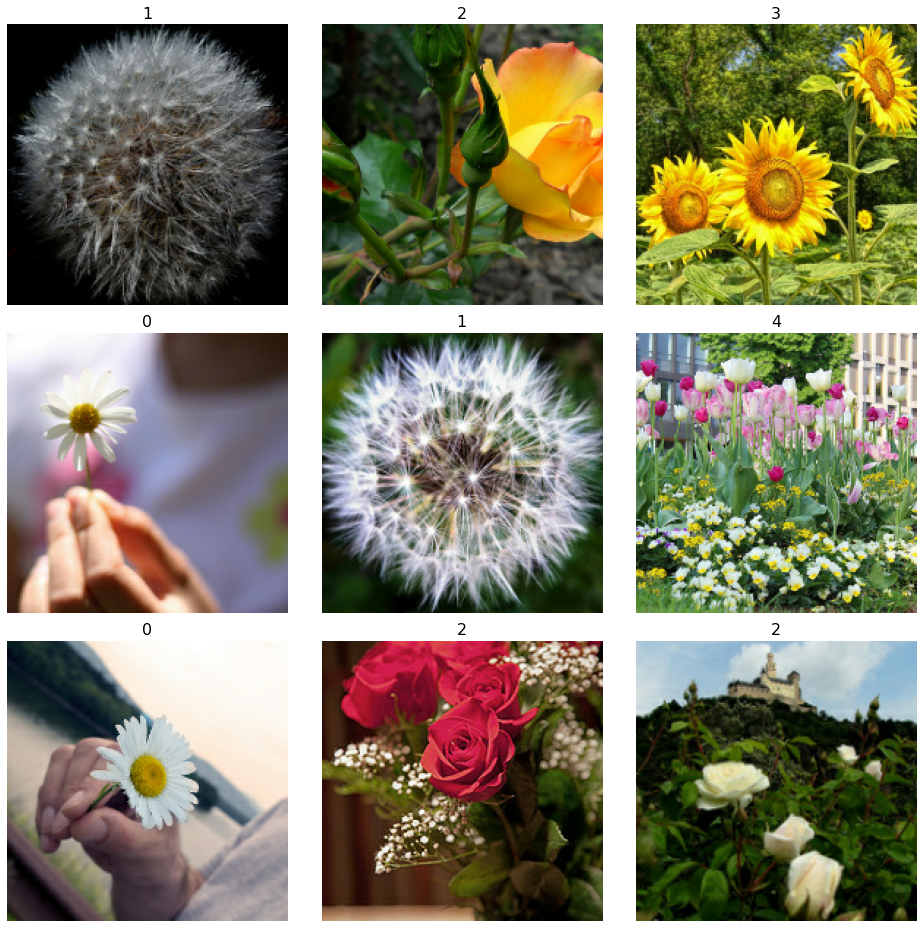

In [ ]:
display_9_images_from_dataset(datasetDecoded)

Let's have a look **if reading from the TFRecord** files is **quicker**. 

In [ ]:
batched_dataset = datasetDecoded.batch(8)
sample_set = batched_dataset.take(20)

for image, label in sample_set: 
    print("Image batch shape {}, {})".format(image.numpy().shape, \
                        [str(lbl) for lbl in label.numpy()]))
    
for image, label in sample_set: 
    print("Image batch shape {}, {})".format(image.numpy().shape, \
                        [str(lbl) for lbl in label.numpy()]))

Image batch shape (8, 192, 192, 3), ['1', '2', '3', '0', '1', '4', '0', '2'])
Image batch shape (8, 192, 192, 3), ['2', '3', '3', '2', '4', '2', '3', '0'])
Image batch shape (8, 192, 192, 3), ['0', '3', '1', '0', '1', '3', '3', '2'])
Image batch shape (8, 192, 192, 3), ['4', '4', '3', '0', '4', '0', '4', '0'])
Image batch shape (8, 192, 192, 3), ['0', '4', '1', '2', '2', '1', '4', '3'])
Image batch shape (8, 192, 192, 3), ['0', '3', '0', '4', '1', '2', '0', '1'])
Image batch shape (8, 192, 192, 3), ['1', '4', '2', '0', '3', '2', '3', '0'])
Image batch shape (8, 192, 192, 3), ['0', '3', '2', '1', '2', '2', '2', '0'])
Image batch shape (8, 192, 192, 3), ['4', '2', '1', '4', '4', '3', '4', '1'])
Image batch shape (8, 192, 192, 3), ['3', '4', '1', '1', '3', '1', '1', '0'])
Image batch shape (8, 192, 192, 3), ['0', '1', '3', '3', '1', '2', '0', '4'])
Image batch shape (8, 192, 192, 3), ['1', '3', '2', '1', '1', '0', '1', '1'])
Image batch shape (8, 192, 192, 3), ['1', '2', '1', '2', '3', '1

## Task1: Cloud Speed tests (8%)

We have just seen that **reading from the pre-processed TFRecord files** is **faster** than reading individual image files and decoding on the fly. 
This task is about **understanding and quantifying this effect** better. 

### 1a): Speed test (5%)

Start by implementing **code for time measurement** to determine the **throughput in images per second**. 
Don't render the images, just print some basic information in order to **avoid measuring image rendering time**. 
It's useful to write to the null device for longer measurements (e.g. 
`print('string', \ file=open("/dev/null",mode='w')`).

Use batches ( `dataset.batch(batch_size)` ) and select a sample with (`dataset.take(batch_number)`). 
Good starting values are 8 and 10, i.e. we take 10 batches of 8 samples each. 

Use the `time.time()` to take the **time measurement** and take it multiple times, reading from the same dataset. 

**Vary** the size of the batch (`batch_size`) and the number of batches (`batch_number`) and **store the results for different values**. 
Store also the **results for each repetition** over the same dataset (repeat 2 or 3 times).

The speed test should be packaged into a **function** `time_configs()` that takes a dataset and the batch_sizes, batch_numbers, and number of repetitions as **arguments** to run a series of tests. 



In [ ]:
# Here are some useful values for testing
#batch_sizes = [2,4] 
#batch_numbers = [3,6] 
#repetitions = [1,2] 

# Modified testing parameters 
batch_sizes = [16, 32, 64, 128] 
batch_numbers = [10, 20, 30] 
repetitions = [1, 2, 3] 

### CODING TASK ###
def time_configs(arg_dataset, arg_batch_sizes, arg_batch_numbers, arg_repititions):
  b_size = []
  b_number = []
  b_datasize = []
  b_reps = []  
  reading_speed = []
  throughput = []

  # looping through parameter combinations
  for size in arg_batch_sizes:
    for number in arg_batch_numbers:
      for reps in arg_repititions:
         batch = arg_dataset.batch(size)
         sample = arg_dataset.take(number)
         # looping through repitions and measuring time for each rep
         for rep in range(reps):
           timer_start = time.time()
           for picture in sample:
             print('string', file=open("/dev/null", mode='w'))
           # storing all data in variable lists
           timer_end = time.time() 
           reading_speed.append(timer_end - timer_start)
           b_size.append(size)
           b_number.append(number)
           b_datasize.append(size * number)
           b_reps.append(reps)
           throughput.append(float((size * number) / (timer_end - timer_start)))          

  return b_size, b_number, b_datasize, b_reps, reading_speed, throughput

**Try your function** with a **small number** of configurations of batch_sizes batch_numbers and repetions, so that we get a set of parameter combinations and corresponding reading speeds.
Try reading from the image files (dataset2) and the TFRecord files (datasetDecoded).



In [ ]:
### CODING TASK ###
# For image files
dataset2_batch_size = []
dataset2_batch_number = []
dataset2_datasize = []
dataset2_reps = []
dataset2_reading_speed = []
dataset2_throughput = []

dataset2_batch_size, dataset2_batch_number, dataset2_datasize, dataset2_reps, dataset2_reading_speed, dataset2_throughput = time_configs(dataset2, batch_sizes, batch_numbers, repetitions)

# For TFR files
datasetD_batch_size = []
datasetD_batch_number = []
datasetD_datasize = []
datasetD_reps = []
datasetD_reading_speed = []
datasetD_throughput = []

datasetD_batch_size, datasetD_batch_number, datasetD_datasize, datasetD_reps, datasetD_reading_speed, datasetD_throughput = time_configs(datasetDecoded, batch_sizes, batch_numbers, repetitions)

### 1b) Speed test analysis (3%)

Do a **linear regression** over pre-processing and reading **speed** as a **function of parameter values**. Look at the parameters `batch_size`, `batch_number`, `repetition` and the dataset size (`batch_size * batch_number`). 

This needs to be done **separately for the two datasets**. 

**Print** the regression results (slope, intercept, pvalue etc) and **plot** the measurements and the regression line for each of the 4 parameters. 


13.470757352960932 -37.256231814364924 0.9926787296805906 5.26953786695834e-66 0.19590527981548808


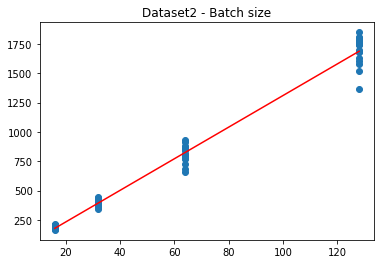

2.8112494430377195 714.7642205025367 0.039433156677136094 0.7422514045342881 8.514338201964485


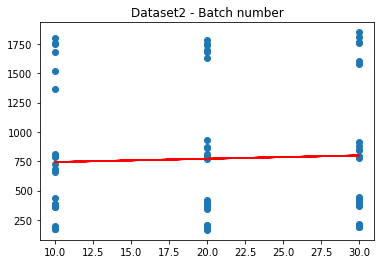

0.4649369591693364 213.06485836008733 0.837210827711361 5.06903471770283e-20 0.03629965271017954


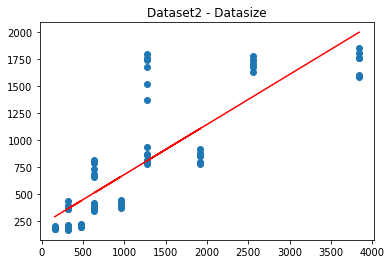

9.406856458074202 749.0398776277846 0.012045256592853396 0.9200091241181025 93.33573102436802


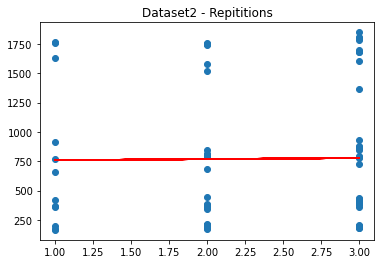

185.67470583997283 15.920953977480167 0.8566036980367816 8.450810231085039e-22 13.36756673495543


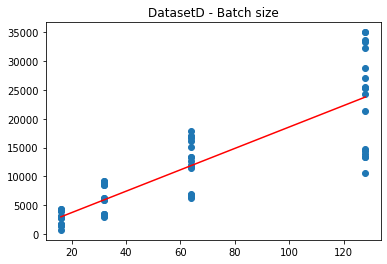

474.61610197436755 1664.0812648884985 0.4167879242666044 0.0002706526570194007 123.72116412985763


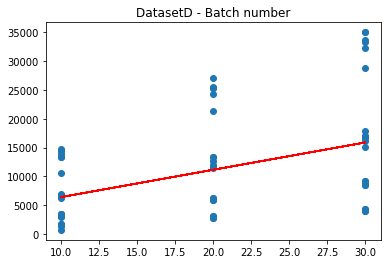

8.782807214013733 617.0346475593706 0.990112658545196 1.8643878118905586e-61 0.14872306060338578


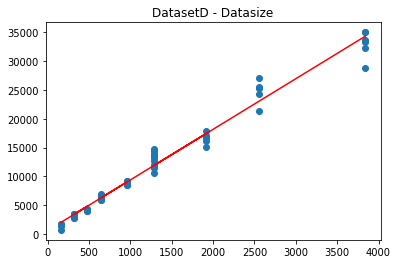

-107.65505907663514 11407.598442221331 -0.008630112954174434 0.9426427801142798 1490.914608598612


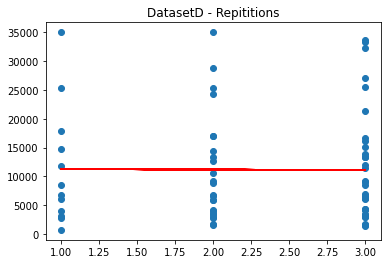

In [ ]:
### CODING TASK ###
import scipy as sp
import numpy as np
from matplotlib import pyplot as plt

# https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.linregress.html
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html

def linear_regression (var_x, var_y, title):
  slope, intercept, r_value, p_value, std_err = sp.stats.linregress(np.array(var_x), np.array(var_y))
  print(slope, intercept, r_value, p_value, std_err)
  regression_line = intercept + slope * np.array(var_x)
  plt.scatter(var_x, var_y)
  plt.plot(var_x, regression_line, 'r-')
  plt.title(title)
  plt.show()

# Dataset2
# Batch size vs throughput
linear_regression(dataset2_batch_size, dataset2_throughput, 'Dataset2 - Batch size')

# Batch number vs throughput
linear_regression(dataset2_batch_number, dataset2_throughput, 'Dataset2 - Batch number')

# Datasize vs throughput
linear_regression(dataset2_datasize, dataset2_throughput, 'Dataset2 - Datasize')

# Reps vs throughput
linear_regression(dataset2_reps, dataset2_throughput, 'Dataset2 - Repititions')

# DatasetDecoded
# Batch size vs throughput
linear_regression(datasetD_batch_size, datasetD_throughput, 'DatasetD - Batch size')

# Batch number vs throughput
linear_regression(datasetD_batch_number, datasetD_throughput, 'DatasetD - Batch number')

# Datasize vs throughput
linear_regression(datasetD_datasize, datasetD_throughput, 'DatasetD - Datasize')

# Reps vs throughput
linear_regression(datasetD_reps, datasetD_throughput, 'DatasetD - Repititions')

## Task 2: Parallelising the speed test with Spark in the cloud. (32%)

As an exercise in **Spark programming and optimisation** as well as **performance analysis**, we will now implement the **speed test** with multiple parameters in parallel with Spark. 
Runing mutliple tests in parallel would **not be a useful approach on a single machine, but it can be in the cloud** (you will be asked to reason about this later). 


### Preparation: Running Spark in the cloud 

In order to test multiple configurations, especially with reasonably large datasets, we will use **Spark** to run **multiple tests in parallel**. 
We will start by looking at **how to use Spark on GCS Dataproc**. 

This section shows you in detail **how to run Python code in Dataproc**. 
You may need to **enable the Dataproc API** on the [console Dataproc page](https://console.cloud.google.com/dataproc/clusters/), if you have not done so, yet. 

First we need to **create a cluster**. We start with a single machine, just to try it out. 

We are using the `gcloud dataproc clusters` command. [Click here for documentation](https://cloud.google.com/sdk/gcloud/reference/dataproc/clusters). 
The **parameter** `--image-version 1.4-ubuntu18` makes sure we get **intended software**. 

Starting a cluster **can take a few minutes**. You can wait for the cell to finish processing or interrupt its execution and check on the [console Dataproc page](https://console.cloud.google.com/dataproc/clusters/) if the cluster is ready.


In [ ]:
CLUSTER = '{}-cluster'.format(PROJECT)
!gcloud dataproc clusters create $CLUSTER \
    --image-version 1.4-ubuntu18 --single-node \
    --master-machine-type n1-standard-2 \
    --master-boot-disk-type pd-ssd --master-boot-disk-size 100 \
    --max-idle 3600s 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/5e70859f-80f1-34ad-b9aa-b17294f17254].
Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


The `--max-idle 3600s` flag means that the cluster will be **deleted automatically** once it has been **idle for 1 hour**. This helps minimising costs for a cluster left running by accident. 

This is a single-node cluster. This is created a bit more quickly than a multi-node cluster, but set-up is still quite slow (several minutes) because of the **restrictions on the free tier**. 
You **can switch to paid tier** and still use your free credit, but then you **may use up your free credit more quickly** and have to **pay for usage**.
If you stay in the free tier Google promises not to charge you. The free tier resources are sufficient for this coursework, if you use the local Spark installation for testing and set parameters with care. All the development of this coursework was done with a free tier account. 

We have not specified the region (we could have used `--region $REGION`) as we set already the default for Dataproc in the beginning. 

You can run the **command below to get extensive information** about your running cluster. 
However, it is usually **more practical** to look at the [console Dataproc page](https://console.cloud.google.com/dataproc/clusters/). 
You can check the details and current state of your cluster by clicking on its name. 
Double-check there at the end of your working session to make sure that no clusters are left running, especially when you are not in free mode any more. 

In [ ]:
!gcloud dataproc clusters describe $CLUSTER 

clusterName: sylvan-surf-311408-cluster
clusterUuid: 922cce26-d715-4883-b34a-c44f8a1eba55
config:
  configBucket: dataproc-staging-us-central1-821543613350-kww9hw6g
  endpointConfig: {}
  gceClusterConfig:
    networkUri: https://www.googleapis.com/compute/v1/projects/sylvan-surf-311408/global/networks/default
    serviceAccountScopes:
    - https://www.googleapis.com/auth/bigquery
    - https://www.googleapis.com/auth/bigtable.admin.table
    - https://www.googleapis.com/auth/bigtable.data
    - https://www.googleapis.com/auth/cloud.useraccounts.readonly
    - https://www.googleapis.com/auth/devstorage.full_control
    - https://www.googleapis.com/auth/devstorage.read_write
    - https://www.googleapis.com/auth/logging.write
    zoneUri: https://www.googleapis.com/compute/v1/projects/sylvan-surf-311408/zones/us-central1-f
  lifecycleConfig:
    idleDeleteTtl: 3600s
    idleStartTime: '2021-04-24T11:08:36.257Z'
  masterConfig:
    diskConfig:
      bootDiskSizeGb: 100
      bootDiskTyp

Now that our cluster is running, we can submit a Spark job. A minimal Spark job is just a Python script. A simple "Hello World" Spark script is provided in a public cloud bucket. Let's have a look at it:

In [ ]:
!gsutil cat gs://dataproc-examples/pyspark/hello-world/hello-world.py 

#!/usr/bin/python
import pyspark
sc = pyspark.SparkContext()
rdd = sc.parallelize(['Hello,', 'world!'])
words = sorted(rdd.collect())
print(words)



... and run it on the cluster. We submit the job with the `gcloud dataproc jobs` command ([click here for the documentation](https://cloud.google.com/sdk/gcloud/reference/dataproc/jobs)) with the cluster name.


In [ ]:
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER \
    gs://dataproc-examples/pyspark/hello-world/hello-world.py 

Job [dce406fdbbf34144972435b70dc792ea] submitted.
Waiting for job output...
21/04/24 11:12:07 INFO org.spark_project.jetty.util.log: Logging initialized @4044ms
21/04/24 11:12:08 INFO org.spark_project.jetty.server.Server: jetty-9.3.z-SNAPSHOT, build timestamp: unknown, git hash: unknown
21/04/24 11:12:08 INFO org.spark_project.jetty.server.Server: Started @4149ms
21/04/24 11:12:08 INFO org.spark_project.jetty.server.AbstractConnector: Started ServerConnector@3052d193{HTTP/1.1,[http/1.1]}{0.0.0.0:4040}
21/04/24 11:12:08 WARN org.apache.spark.scheduler.FairSchedulableBuilder: Fair Scheduler configuration file not found so jobs will be scheduled in FIFO order. To use fair scheduling, configure pools in fairscheduler.xml or set spark.scheduler.allocation.file to a file that contains the configuration.
21/04/24 11:12:09 INFO org.apache.hadoop.yarn.client.RMProxy: Connecting to ResourceManager at sylvan-surf-311408-cluster-m/10.128.0.4:8032
21/04/24 11:12:09 INFO org.apache.hadoop.yarn.clie

The `trackingUrl` shown above will only work as long as the job is running. On to the [dataproc page](https://console.cloud.google.com/dataproc/clusters/), you can click through to your cluster page and from there to your job page to see details on past jobs.

You may get some warnings like this: 
`WARN org.apache.spark.scheduler.FairSchedulableBuilder: Fair' ...
or this one:
`WARN org.apache.hadoop.hdfs.DataStreamer: Caught exception`. There was not enough time to research these fully but they don't affect what we do here and can be ignored. 

One issue is that we need to **get output data from the cluster back to the notebook**. We can output text through printing into the output stream, but that does not work well for scaling up, for automation or for binary data. 

A better solution is to **pass an argument** to the job, to tell the job on the cluster **where to write the output**. 
This requires a bit of extra code as shown below using the argparse package.
The example below the checks if the script runs in Colab and if that is the case, it does not execute the run function. 
This is useful for quick testing with a local spark instance.

For running the file in DataProc, write to a local file `hello-world.py`, uncomment the  the `%%writefile` magic as in the cell below.


In [ ]:
%%writefile hello-world.py

import sys
import pyspark
import argparse
import pickle 

def save(object,bucket,filename):
    with open(filename,mode='wb') as f:
        pickle.dump(object,f)
    print("Saving {} to {}".format(filename,bucket))
    import subprocess
    proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
    print("gstuil returned: " + str(proc.returncode))
    print(str(proc.stderr))

def runWordCount(argv): 
    # Parse the provided arguments
    print(argv)
    parser = argparse.ArgumentParser() # get a parser object
    parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
    parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
    args = parser.parse_args(argv) # read the value
    # the value provided with --out_bucket is now in args.out_bucket
    sc = pyspark.SparkContext.getOrCreate()
    rdd = sc.parallelize(['Hello,', 'world!'])
    words = sorted(rdd.collect())
    save(words,args.out_bucket,args.out_file)

if  'google.colab' not in sys.modules: # Don't use system arguments run in Colab 
    runWordCount(sys.argv[1:])  
elif __name__ == "__main__" : # but define them manually
    runWordCount(["--out_bucket", BUCKET, "--out_file", "words.pkl"])

Writing hello-world.py


**Once the code works as intended**, you can write it to the local disk (on your Colab instance). For this, **uncomment the first line with the `%%writefile` magic** and then **re-run the cell**. 

Then **check** that the file **is in the current directory** and **has the right contents** like this:

In [ ]:
!pwd
!ls -l hello-world.py
!cat hello-world.py

/content
-rw-r--r-- 1 root root 1402 Apr 24 11:12 hello-world.py

import sys
import pyspark
import argparse
import pickle 

def save(object,bucket,filename):
    with open(filename,mode='wb') as f:
        pickle.dump(object,f)
    print("Saving {} to {}".format(filename,bucket))
    import subprocess
    proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
    print("gstuil returned: " + str(proc.returncode))
    print(str(proc.stderr))

def runWordCount(argv): 
    # Parse the provided arguments
    print(argv)
    parser = argparse.ArgumentParser() # get a parser object
    parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
    parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
    args = parser.parse_args(argv) # read the value
    # the value

We can now submit the job with an extra section for application arguments. It's started by `--`, which indicates that all following arguments are to be sent to our Spark application. 

In [ ]:
FILENAME = 'words.pkl'
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./hello-world.py \
    -- --out_bucket $BUCKET --out_file $FILENAME

Job [50e1a6c8dceb4e43a8bee5a054aaaf9d] submitted.
Waiting for job output...
['--out_bucket', 'gs://sylvan-surf-311408-storage', '--out_file', 'words.pkl']
21/04/24 11:13:04 INFO org.spark_project.jetty.util.log: Logging initialized @3232ms
21/04/24 11:13:04 INFO org.spark_project.jetty.server.Server: jetty-9.3.z-SNAPSHOT, build timestamp: unknown, git hash: unknown
21/04/24 11:13:04 INFO org.spark_project.jetty.server.Server: Started @3340ms
21/04/24 11:13:04 INFO org.spark_project.jetty.server.AbstractConnector: Started ServerConnector@6223eed5{HTTP/1.1,[http/1.1]}{0.0.0.0:4040}
21/04/24 11:13:05 WARN org.apache.spark.scheduler.FairSchedulableBuilder: Fair Scheduler configuration file not found so jobs will be scheduled in FIFO order. To use fair scheduling, configure pools in fairscheduler.xml or set spark.scheduler.allocation.file to a file that contains the configuration.
21/04/24 11:13:06 INFO org.apache.hadoop.yarn.client.RMProxy: Connecting to ResourceManager at sylvan-surf-3114

Once the job has finished, we can **use the output** by **copying it from the bucket** and **reading it as a local file**.

In [ ]:
# Make sure you are writing to the right directory
%cd /content/drive/MyDrive/BD-CW
!gsutil cp $BUCKET/$FILENAME . 
!ls -l
with open(FILENAME,mode='rb') as f:
    words = pickle.load(f) 

print("Content of {} : {}".format(FILENAME,words))

/content/drive/MyDrive/BD-CW
Copying gs://sylvan-surf-311408-storage/words.pkl...
/ [1 files][   34.0 B/   34.0 B]                                                
Operation completed over 1 objects/34.0 B.                                       
total 13
-rw------- 1 root root 10325 Apr 24 07:11 spark_job.py
-rw------- 1 root root  1683 Apr 24 07:20 task_2b_v1_test_results.pkl
-rw------- 1 root root    34 Apr 24 11:13 words.pkl
Content of words.pkl : ['Hello,', 'world!']


At the end of a session we should **delete the cluster**, as it incurs a **cost for the time** it runs.  

In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 
# the -q flag disables the confirmation prompt 
# , we want to make sure it really gets deleted

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/6c916d37-9742-3067-b72c-d5216c11dea7].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


### 2a) Create the script (12%)
Your task is now to **port the speed test to Spark** for running it in the cloud in DataProc. 
**Adapt the preprocessing code** as a Spark programm that performs the same actions as above, but **with Spark RDDs in a distributed way**. 
The distribution should be such that **each parameter combination (except repetition)** is processed in a separate Spark task.

More specifically: 
*   i) combine the previous cells to have the code to create a dataset and create a list of parameter combinations in an RDD (2%)
*   ii) get a spark context and  create the dataset and run timing test for each combination in parallel (2%)
*   iii) transform the resulting RDD to the structure \( parameter_combination, images_per_second \) and save these values in an array (2%)
*   iv) create an RDD with all results for each parameter as (parameter_value,images_per_second) and collect the result for each parameter  (1%)
*   v) create an RDD with the average reading speeds for each paramter value and collect the results. Keep associativity in mind when implementing the average. (3%) 
*   vi) write the results to a pickle file in your bucket (1%)
*   vii) Write your code it into a file using the *cell magic* `%%writefile spark_job.py` (1%)


**Important:** The task here is not to parallelize the pre-processing, but to run multiple speed tests in parallel using Spark.


In [ ]:
# %%writefile spark_job.py

### CODING TASK ###
## Take the timing for reading with multiple configurations in parallel with Spark

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
from matplotlib import pyplot as plt
import tensorflow as tf
import pickle
import pyspark

GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
GCS_OUTPUT = 'gs://flowers-public/tfrecords-jpeg-192x192-2/'
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

def resize_and_crop_image(image, label):
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset_tfr(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def load_dataset_img():
  dataset_filename = tf.data.Dataset.list_files(GCS_PATTERN) #Image Files
  dataset_decode = dataset_filename.map(decode_jpeg_and_label)
  dataset_final = dataset_decode.map(resize_and_crop_image)  
  return dataset_final

# Seperate reading speed function for tfr files
def rdd_reading_speed_tfr(parameters):
  filenames = tf.io.gfile.glob(GCS_OUTPUT + "*.tfrec")
  dataset = load_dataset_tfr(filenames)

  timing_test_data_tfr = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_tfr.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_tfr

# Seperate reading speed function for img files
def rdd_reading_speed_img(parameters):
  dataset = load_dataset_img()

  timing_test_data_img = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_img.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_img

def save(object,bucket,filename):
    with open(filename,mode='wb') as f:
        pickle.dump(object,f)
    print("Saving {} to {}".format(filename,bucket))
    import subprocess
    proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
    print("gstuil returned: " + str(proc.returncode))
    print(str(proc.stderr))

def task_testing(argv):
  # Parse the provided arguments
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # parameters
  batch_sizes = [16, 32, 64, 128] 
  batch_numbers = [10, 20, 30] 
  repetitions = [1, 2, 3] 

  parameters = []

  for size in batch_sizes:
    for number in batch_numbers:
      for reps in repetitions:
        parameters.append([size, number, reps]) # list of paramter combinations through loops

  from pyspark import sql
  from pyspark.sql import SparkSession
  from pyspark.sql import SQLContext
  from pyspark.sql import Row

  column_headings = ["batch_size", "batch_numbers", "datasize", "repititions", "reading_speed", "throughput"]

  sc_tfr = pyspark.SparkContext.getOrCreate()
  rdd_tfr = sc_tfr.parallelize(parameters) # parallelizing the rdd
  result_tfr = rdd_tfr.flatMap(rdd_reading_speed_tfr) # using flatmap to flatten and obtain simple list of lists
  spark_tfr = SparkSession(sc_tfr) # spark session to convert result into spark dataframe
  result_tfr_df = result_tfr.toDF(column_headings) # converting to dataframe
  #result_tfr_df.show()

  sc_img = pyspark.SparkContext.getOrCreate()
  rdd_img = sc_img.parallelize(parameters) # parallelizing the rdd
  result_img = rdd_img.flatMap(rdd_reading_speed_img) # using flatmap to flatten and obtain simple list of lists
  spark_img = SparkSession(sc_img) # spark session to convert result into spark dataframe
  result_img_df = result_img.toDF(column_headings) # converting to dataframe
  #result_img_df.show()

  # extracting columns from dataframe
  tfr_size_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  tfr_size_speed = tfr_size_speed_rdd.collect()
  tfr_number_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  tfr_number_speed = tfr_number_speed_rdd.collect()
  tfr_datasize_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  tfr_datasize_speed = tfr_datasize_speed_rdd.collect()
  tfr_repititions_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  tfr_repititions_speed = tfr_repititions_speed_rdd.collect()

  img_size_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  img_size_speed = img_size_speed_rdd.collect()
  img_number_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  img_number_speed = img_number_speed_rdd.collect()
  img_datasize_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  img_datasize_speed = img_datasize_speed_rdd.collect()
  img_repititions_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  img_repititions_speed = img_repititions_speed_rdd.collect()

  # averaging function implemented as per the stack exchange page linked below
  # https://stackoverflow.com/questions/29930110/calculating-the-averages-for-each-key-in-a-pairwise-k-v-rdd-in-spark-with-pyth

  tfr_size_speed_avg_rdd = tfr_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_size_speed_avg = tfr_size_speed_avg_rdd.collect()
  tfr_number_speed_avg_rdd = tfr_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_number_speed_avg = tfr_number_speed_avg_rdd.collect()
  tfr_datasize_speed_avg_rdd = tfr_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_datasize_speed_avg = tfr_datasize_speed_avg_rdd.collect()
  tfr_repititions_speed_avg_rdd = tfr_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_repititions_speed_avg = tfr_repititions_speed_avg_rdd.collect()

  img_size_speed_avg_rdd = img_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_size_speed_avg = img_size_speed_avg_rdd.collect()
  img_number_speed_avg_rdd = img_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_number_speed_avg = img_number_speed_avg_rdd.collect()
  img_datasize_speed_avg_rdd = img_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_datasize_speed_avg = img_datasize_speed_avg_rdd.collect()
  img_repititions_speed_avg_rdd = img_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_repititions_speed_avg = img_repititions_speed_avg_rdd.collect()

  # https://stackoverflow.com/questions/42350635/how-can-you-pickle-multiple-objects-in-one-file?noredirect=1&lq=1

  save_object = (
      tfr_size_speed,
      tfr_number_speed,
      tfr_datasize_speed,
      tfr_repititions_speed,
      img_size_speed,
      img_number_speed,
      img_datasize_speed,
      img_repititions_speed,
      tfr_size_speed_avg,
      tfr_number_speed_avg,
      tfr_datasize_speed_avg,
      tfr_repititions_speed_avg,
      img_size_speed_avg,
      img_number_speed_avg,
      img_datasize_speed_avg,
      img_repititions_speed_avg
  )

  # save tuple of all parameter results
  save(save_object, args.out_bucket, args.out_file)

#if 'google.colab' not in sys.modules: # Don't use system arguments run in Colab 
#    task_testing(sys.argv[1:])  
#elif __name__ == "__main__" : # but define them manually
#    task_testing(["--out_bucket", BUCKET, "--out_file", "task_2a_test_results.pkl"])


### 2b) Set up a cluster and run the script. (4%)

In the free credit tier on Google Cloud, there are the following **restrictions**:
- max 100GB of *SSD persistent disk*
- max 2000GB of *standard persisten disk* 
- max 8 *vCPU*s

See [here](https://cloud.google.com/free/docs/gcp-free-tier#free-trial) for details 
The disks are virtual disks, where the I/O speed is limited in proportion to the size, so that we should allocated them evenly.
This has mainly an effect on the time the cluster needs to start, as we are reading the data mainly from the bucket and we are not writing much to disk at all.   

The largest possible cluster within these constraints has 1 master and 7 worker nodes. 
Each of them with 1 (virtual) CPU. The master should get the full *SSD* capacity and the 7 worker nodes should get equal shares of the *standard* disk capacity to maximise throughput. 

In order to run our code on the cluster, we need to **make sure** that **TensorFlow 2 is installed**. The Colab magic  `%tensorflow_version 2.x` will not work within Spark. 
Instead, enable package installation by passing a flag `--initialization-actions` with argument `gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh` (this is a public script that will read metadata to determine which packages to install). 
The packages are then specified by providing a `--metadata` flag with the argument `PIP_PACKAGES=tensorflow==2.1.0`. 
(2%)

In [ ]:
### CODING TASK ###
# TESTING CODE ONLY - IGNORE
# Running with standard configuration 1 machine with 2 vCPU and no workers for parallel processing
CLUSTER = '{}-cluster'.format(PROJECT)

!gcloud dataproc clusters create $CLUSTER \
  --bucket $PROJECT-storage \
  --image-version 1.4-ubuntu18 --single-node \
  --master-machine-type n1-standard-2 \
  --master-boot-disk-type pd-ssd --master-boot-disk-size 100\
  --initialization-actions gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh \
  --metadata PIP_PACKAGES=tensorflow==2.1.0 \
  --max-idle 3600s

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/90383da6-72d1-32a9-9940-806b1ff7ddae].
Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


In [ ]:
%%writefile spark_job.py

### CODING TASK ###
## Take the timing for reading with multiple configurations in parallel with Spark

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
import pickle
import pyspark

GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
GCS_OUTPUT = 'gs://flowers-public/tfrecords-jpeg-192x192-2/'
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

def resize_and_crop_image(image, label):
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset_tfr(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def load_dataset_img():
  dataset_filename = tf.data.Dataset.list_files(GCS_PATTERN) #Image Files
  dataset_decode = dataset_filename.map(decode_jpeg_and_label)
  dataset_final = dataset_decode.map(resize_and_crop_image)  
  return dataset_final

def rdd_reading_speed_tfr(parameters):
  filenames = tf.io.gfile.glob(GCS_OUTPUT + "*.tfrec")
  dataset = load_dataset_tfr(filenames)

  timing_test_data_tfr = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_tfr.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_tfr

def rdd_reading_speed_img(parameters):
  dataset = load_dataset_img()

  timing_test_data_img = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_img.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_img

def save(object,bucket,filename):
    with open(filename,mode='wb') as f:
        pickle.dump(object,f)
    print("Saving {} to {}".format(filename,bucket))
    import subprocess
    proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
    print("gstuil returned: " + str(proc.returncode))
    print(str(proc.stderr))

def task_testing(argv):
  # Parse the provided arguments
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # parameters
  batch_sizes = [16, 32, 64, 128] 
  batch_numbers = [10, 20, 30] 
  repetitions = [1, 2, 3] 

  parameters = []

  for size in batch_sizes:
    for number in batch_numbers:
      for reps in repetitions:
        parameters.append([size, number, reps])

  from pyspark import sql
  from pyspark.sql import SparkSession
  from pyspark.sql import SQLContext
  from pyspark.sql import Row

  column_headings = ["batch_size", "batch_numbers", "datasize", "repititions", "reading_speed", "throughput"]

  sc_tfr = pyspark.SparkContext.getOrCreate()
  rdd_tfr = sc_tfr.parallelize(parameters)
  result_tfr = rdd_tfr.flatMap(rdd_reading_speed_tfr)
  spark_tfr = SparkSession(sc_tfr)
  result_tfr_df = result_tfr.toDF(column_headings)
  #result_tfr_df.show()

  sc_img = pyspark.SparkContext.getOrCreate()
  rdd_img = sc_img.parallelize(parameters)
  result_img = rdd_img.flatMap(rdd_reading_speed_img)
  spark_img = SparkSession(sc_img)
  result_img_df = result_img.toDF(column_headings)
  #result_img_df.show()

  tfr_size_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  tfr_size_speed = tfr_size_speed_rdd.collect()
  tfr_number_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  tfr_number_speed = tfr_number_speed_rdd.collect()
  tfr_datasize_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  tfr_datasize_speed = tfr_datasize_speed_rdd.collect()
  tfr_repititions_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  tfr_repititions_speed = tfr_repititions_speed_rdd.collect()

  img_size_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  img_size_speed = img_size_speed_rdd.collect()
  img_number_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  img_number_speed = img_number_speed_rdd.collect()
  img_datasize_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  img_datasize_speed = img_datasize_speed_rdd.collect()
  img_repititions_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  img_repititions_speed = img_repititions_speed_rdd.collect()

  # https://stackoverflow.com/questions/29930110/calculating-the-averages-for-each-key-in-a-pairwise-k-v-rdd-in-spark-with-pyth

  tfr_size_speed_avg_rdd = tfr_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_size_speed_avg = tfr_size_speed_avg_rdd.collect()
  tfr_number_speed_avg_rdd = tfr_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_number_speed_avg = tfr_number_speed_avg_rdd.collect()
  tfr_datasize_speed_avg_rdd = tfr_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_datasize_speed_avg = tfr_datasize_speed_avg_rdd.collect()
  tfr_repititions_speed_avg_rdd = tfr_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_repititions_speed_avg = tfr_repititions_speed_avg_rdd.collect()

  img_size_speed_avg_rdd = img_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_size_speed_avg = img_size_speed_avg_rdd.collect()
  img_number_speed_avg_rdd = img_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_number_speed_avg = img_number_speed_avg_rdd.collect()
  img_datasize_speed_avg_rdd = img_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_datasize_speed_avg = img_datasize_speed_avg_rdd.collect()
  img_repititions_speed_avg_rdd = img_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_repititions_speed_avg = img_repititions_speed_avg_rdd.collect()

  # https://stackoverflow.com/questions/42350635/how-can-you-pickle-multiple-objects-in-one-file?noredirect=1&lq=1

  save_object = (
      tfr_size_speed,
      tfr_number_speed,
      tfr_datasize_speed,
      tfr_repititions_speed,
      img_size_speed,
      img_number_speed,
      img_datasize_speed,
      img_repititions_speed,
      tfr_size_speed_avg,
      tfr_number_speed_avg,
      tfr_datasize_speed_avg,
      tfr_repititions_speed_avg,
      img_size_speed_avg,
      img_number_speed_avg,
      img_datasize_speed_avg,
      img_repititions_speed_avg
  )

  save(save_object, args.out_bucket, args.out_file)

if __name__ == '__main__':
  FILENAME = 'task_2b_v1_test_results.pkl'
  PROJECT = 'sylvan-surf-311408'
  BUCKET = 'gs://{}-storage'.format(PROJECT)
  task_testing(["--out_bucket", BUCKET, "--out_file", FILENAME])


Writing spark_job.py


In [ ]:
FILENAME = 'task_2b_v1_test_results.pkl'
PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./spark_job.py \
    -- --out_bucket $BUCKET --out_file $FILENAME

Job [b5dd7eb32dc149e48a1eacfcba605d71] submitted.
Waiting for job output...
2021-04-24 07:11:32.426077: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-24 07:11:32.426316: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-24 07:11:32.426349: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
['--out_bucket', 'gs://sylvan-surf-311408-storage', '--out_file', 'task_2b_v1_test_results.pkl']
21/04/24 07:11:3

In [ ]:
!gsutil cp $BUCKET/task_2b_v1_test_results.pkl . 
with open("task_2b_v1_test_results.pkl",mode='rb') as f:    
    output = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_2b_v1_test_results.pkl...
/ [1 files][  1.6 KiB/  1.6 KiB]                                                
Operation completed over 1 objects/1.6 KiB.                                      


In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/203ea9a5-b9c4-38b6-887d-8de2624da475].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


Once the cluster is running, you can run the job. It is useful to create a new filename, so that results don't get overwritten. 

You can for instance use `str(datetime.datetime.now().strftime("%y%m%d-%H%M")` to get a string with the current date and time and use that in the file name.

While you run this job, switch to the DataProc web page and take images of the CPU and Network load over time. 
Again, don't use the SCREENSHOT function that Google provides, but just take a picture of the graphs you see for the VMs. These will be needed in the next task. 
(2%)

In [ ]:
### CODING TASK ###
# Running with 1 master and 7 workers with persistant disk assigned 2000 / 7 ~= 285
CLUSTER = '{}-cluster'.format(PROJECT)

!gcloud dataproc clusters create $CLUSTER \
  --bucket $PROJECT-storage \
  --image-version 1.4-ubuntu18 \
  --master-machine-type n1-standard-1 \
  --master-boot-disk-type pd-ssd --master-boot-disk-size 100 \
  --num-workers 7 --worker-machine-type n1-standard-1 --worker-boot-disk-size 285 \
  --initialization-actions gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh \
  --metadata PIP_PACKAGES=tensorflow==2.1.0 \
  --max-idle 3600s

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/812e832b-0fef-3feb-90a3-4cac5fae8662].

Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


In [ ]:
%%writefile spark_job.py

### CODING TASK ###
## Take the timing for reading with multiple configurations in parallel with Spark

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
import pickle
import pyspark

GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
GCS_OUTPUT = 'gs://flowers-public/tfrecords-jpeg-192x192-2/'
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

def resize_and_crop_image(image, label):
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset_tfr(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def load_dataset_img():
  dataset_filename = tf.data.Dataset.list_files(GCS_PATTERN) #Image Files
  dataset_decode = dataset_filename.map(decode_jpeg_and_label)
  dataset_final = dataset_decode.map(resize_and_crop_image)  
  return dataset_final

def rdd_reading_speed_tfr(parameters):
  filenames = tf.io.gfile.glob(GCS_OUTPUT + "*.tfrec")
  dataset = load_dataset_tfr(filenames)

  timing_test_data_tfr = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_tfr.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_tfr

def rdd_reading_speed_img(parameters):
  dataset = load_dataset_img()

  timing_test_data_img = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_img.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_img

def save(object,bucket,filename):
    with open(filename,mode='wb') as f:
        pickle.dump(object,f)
    print("Saving {} to {}".format(filename,bucket))
    import subprocess
    proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
    print("gstuil returned: " + str(proc.returncode))
    print(str(proc.stderr))

def task_testing(argv):
  # Parse the provided arguments
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # parameters
  batch_sizes = [16, 32, 64, 128] 
  batch_numbers = [10, 20, 30] 
  repetitions = [1, 2, 3] 

  parameters = []

  for size in batch_sizes:
    for number in batch_numbers:
      for reps in repetitions:
        parameters.append([size, number, reps])

  from pyspark import sql
  from pyspark.sql import SparkSession
  from pyspark.sql import SQLContext
  from pyspark.sql import Row

  column_headings = ["batch_size", "batch_numbers", "datasize", "repititions", "reading_speed", "throughput"]

  sc_tfr = pyspark.SparkContext.getOrCreate()
  rdd_tfr = sc_tfr.parallelize(parameters)
  result_tfr = rdd_tfr.flatMap(rdd_reading_speed_tfr)
  spark_tfr = SparkSession(sc_tfr)
  result_tfr_df = result_tfr.toDF(column_headings)
  #result_tfr_df.show()

  sc_img = pyspark.SparkContext.getOrCreate()
  rdd_img = sc_img.parallelize(parameters)
  result_img = rdd_img.flatMap(rdd_reading_speed_img)
  spark_img = SparkSession(sc_img)
  result_img_df = result_img.toDF(column_headings)
  #result_img_df.show()

  tfr_size_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  tfr_size_speed = tfr_size_speed_rdd.collect()
  tfr_number_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  tfr_number_speed = tfr_number_speed_rdd.collect()
  tfr_datasize_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  tfr_datasize_speed = tfr_datasize_speed_rdd.collect()
  tfr_repititions_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  tfr_repititions_speed = tfr_repititions_speed_rdd.collect()

  img_size_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  img_size_speed = img_size_speed_rdd.collect()
  img_number_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  img_number_speed = img_number_speed_rdd.collect()
  img_datasize_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  img_datasize_speed = img_datasize_speed_rdd.collect()
  img_repititions_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  img_repititions_speed = img_repititions_speed_rdd.collect()

  # https://stackoverflow.com/questions/29930110/calculating-the-averages-for-each-key-in-a-pairwise-k-v-rdd-in-spark-with-pyth

  tfr_size_speed_avg_rdd = tfr_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_size_speed_avg = tfr_size_speed_avg_rdd.collect()
  tfr_number_speed_avg_rdd = tfr_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_number_speed_avg = tfr_number_speed_avg_rdd.collect()
  tfr_datasize_speed_avg_rdd = tfr_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_datasize_speed_avg = tfr_datasize_speed_avg_rdd.collect()
  tfr_repititions_speed_avg_rdd = tfr_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_repititions_speed_avg = tfr_repititions_speed_avg_rdd.collect()

  img_size_speed_avg_rdd = img_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_size_speed_avg = img_size_speed_avg_rdd.collect()
  img_number_speed_avg_rdd = img_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_number_speed_avg = img_number_speed_avg_rdd.collect()
  img_datasize_speed_avg_rdd = img_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_datasize_speed_avg = img_datasize_speed_avg_rdd.collect()
  img_repititions_speed_avg_rdd = img_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_repititions_speed_avg = img_repititions_speed_avg_rdd.collect()

  # https://stackoverflow.com/questions/42350635/how-can-you-pickle-multiple-objects-in-one-file?noredirect=1&lq=1

  save_object = (
      tfr_size_speed,
      tfr_number_speed,
      tfr_datasize_speed,
      tfr_repititions_speed,
      img_size_speed,
      img_number_speed,
      img_datasize_speed,
      img_repititions_speed,
      tfr_size_speed_avg,
      tfr_number_speed_avg,
      tfr_datasize_speed_avg,
      tfr_repititions_speed_avg,
      img_size_speed_avg,
      img_number_speed_avg,
      img_datasize_speed_avg,
      img_repititions_speed_avg
  )

  save(save_object, args.out_bucket, args.out_file)

if __name__ == '__main__':
  FILENAME = 'task_2b_v2_test_results.pkl'
  PROJECT = 'sylvan-surf-311408'
  BUCKET = 'gs://{}-storage'.format(PROJECT)
  task_testing(["--out_bucket", BUCKET, "--out_file", FILENAME])

Overwriting spark_job.py


In [ ]:
FILENAME = 'task_2b_v2_test_results.pkl'
PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./spark_job.py \
    -- --out_bucket $BUCKET --out_file $FILENAME

Job [cead5555da744e5e964663306df31078] submitted.
Waiting for job output...
2021-04-25 13:09:06.785855: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 13:09:06.786178: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 13:09:06.786231: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
['--out_bucket', 'gs://sylvan-surf-311408-storage', '--out_file', 'task_2b_v2_test_results.pkl']
21/04/25 13:09:1

In [ ]:
!gsutil cp $BUCKET/task_2b_v2_test_results.pkl . 
with open("task_2b_v2_test_results.pkl",mode='rb') as f:    
    output2 = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_2b_v2_test_results.pkl...
/ [1 files][  9.7 KiB/  9.7 KiB]                                                
Operation completed over 1 objects/9.7 KiB.                                      


In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/3cff63b1-1b8e-306a-8fa9-7202e00b9fd1].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


### 2c) Improve cluster efficiency (6%)

If you implemented a straightfoward version, you will probably have some inefficiencies in your code. 
There are two main aspects: 
- Caching 
- Parallelisation branches

i) Because we are reading multiple times from the RDD to read the valudes for the different parameters and their averages, caching existing results is important. Explain where in the process caching can help, and add it to your code, if you haven't yet. Measure the the effect of using caching or not using it.

ii) You will probably observe that all the computation is done on only two branches, if you do the straightforward implementation. This can be adressed by using the second parameter in the initial call parallelize. 

Write make the suitable changes in the code you have written above and mark them up in comments as `### TASK 2Ci ###` and  `### TASK 2cii ###`. 

Explain in your report what the reasons for these changes are and demonstrate and interpret their effects.

In [ ]:
### CODING TASK ###
# Running with 1 master and 7 workers with persistant disk assigned 2000 / 7 ~= 285
CLUSTER = '{}-cluster'.format(PROJECT)

!gcloud dataproc clusters create $CLUSTER \
  --bucket $PROJECT-storage \
  --image-version 1.4-ubuntu18 \
  --master-machine-type n1-standard-1 \
  --master-boot-disk-type pd-ssd --master-boot-disk-size 100 \
  --num-workers 7 --worker-machine-type n1-standard-1 --worker-boot-disk-size 285 \
  --initialization-actions gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh \
  --metadata PIP_PACKAGES=tensorflow==2.1.0 \
  --max-idle 3600s

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/c141a40a-0927-365b-8f15-32e16f482fc2].

Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


In [ ]:
%%writefile spark_job.py

### CODING TASK ###
## Take the timing for reading with multiple configurations in parallel with Spark

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
import pickle
import pyspark

GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
GCS_OUTPUT = 'gs://flowers-public/tfrecords-jpeg-192x192-2/'
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

def resize_and_crop_image(image, label):
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset_tfr(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def load_dataset_img():
  dataset_filename = tf.data.Dataset.list_files(GCS_PATTERN) #Image Files
  dataset_decode = dataset_filename.map(decode_jpeg_and_label)
  dataset_final = dataset_decode.map(resize_and_crop_image)  
  return dataset_final

def rdd_reading_speed_tfr(parameters):
  filenames = tf.io.gfile.glob(GCS_OUTPUT + "*.tfrec")
  dataset = load_dataset_tfr(filenames)

  timing_test_data_tfr = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_tfr.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_tfr

def rdd_reading_speed_img(parameters):
  dataset = load_dataset_img()

  timing_test_data_img = []

  size = parameters[0]
  number = parameters[1]
  reps = parameters[2]

  batch = dataset.batch(size)
  sample = dataset.take(number)

  for rep in range(reps):
    timer_start = time.time()
    for picture in sample:
      print('string', file=open("/dev/null", mode='w'))
    timer_end = time.time()
    reading_speed = timer_end - timer_start
    throughput = float((size * number) / (timer_end - timer_start))
    timing_test_data_img.append([size, number, (size * number), reps, reading_speed, throughput]) 

  return timing_test_data_img

def save(object,bucket,filename):
    with open(filename,mode='wb') as f:
        pickle.dump(object,f)
    print("Saving {} to {}".format(filename,bucket))
    import subprocess
    proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
    print("gstuil returned: " + str(proc.returncode))
    print(str(proc.stderr))

def task_testing(argv):
  # Parse the provided arguments
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # parameters
  batch_sizes = [16, 32, 64, 128] 
  batch_numbers = [10, 20, 30] 
  repetitions = [1, 2, 3] 

  parameters = []

  for size in batch_sizes:
    for number in batch_numbers:
      for reps in repetitions:
        parameters.append([size, number, reps])

  from pyspark import sql
  from pyspark.sql import SparkSession
  from pyspark.sql import SQLContext
  from pyspark.sql import Row

  column_headings = ["batch_size", "batch_numbers", "datasize", "repititions", "reading_speed", "throughput"]

  sc_tfr = pyspark.SparkContext.getOrCreate()
  ### TASK 2Cii ###
  rdd_tfr = sc_tfr.parallelize(parameters, len(parameters))
  result_tfr = rdd_tfr.flatMap(rdd_reading_speed_tfr)
  ### TASK 2Ci ###
  # Caching the result_tfr rdd in order to avoid repeated timing function calls 
  result_tfr.cache()
  spark_tfr = SparkSession(sc_tfr)
  result_tfr_df = result_tfr.toDF(column_headings)
  #result_tfr_df.show()

  sc_img = pyspark.SparkContext.getOrCreate()
  ### TASK 2Cii ###
  rdd_img = sc_img.parallelize(parameters, len(parameters))
  result_img = rdd_img.flatMap(rdd_reading_speed_img)
  ### TASK 2Ci ###
  result_img.cache()
  spark_img = SparkSession(sc_img)
  result_img_df = result_img.toDF(column_headings)
  #result_img_df.show()

  tfr_size_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  tfr_size_speed = tfr_size_speed_rdd.collect()
  tfr_number_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  tfr_number_speed = tfr_number_speed_rdd.collect()
  tfr_datasize_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  tfr_datasize_speed = tfr_datasize_speed_rdd.collect()
  tfr_repititions_speed_rdd = result_tfr_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  tfr_repititions_speed = tfr_repititions_speed_rdd.collect()

  img_size_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_size']), float(x['throughput'])))
  img_size_speed = img_size_speed_rdd.collect()
  img_number_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['batch_numbers']), float(x['throughput'])))
  img_number_speed = img_number_speed_rdd.collect()
  img_datasize_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['datasize']), float(x['throughput'])))
  img_datasize_speed = img_datasize_speed_rdd.collect()
  img_repititions_speed_rdd = result_img_df.rdd.map(lambda x: (int(x['repititions']), float(x['throughput'])))
  img_repititions_speed = img_repititions_speed_rdd.collect()

  # https://stackoverflow.com/questions/29930110/calculating-the-averages-for-each-key-in-a-pairwise-k-v-rdd-in-spark-with-pyth

  tfr_size_speed_avg_rdd = tfr_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_size_speed_avg = tfr_size_speed_avg_rdd.collect()
  tfr_number_speed_avg_rdd = tfr_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_number_speed_avg = tfr_number_speed_avg_rdd.collect()
  tfr_datasize_speed_avg_rdd = tfr_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_datasize_speed_avg = tfr_datasize_speed_avg_rdd.collect()
  tfr_repititions_speed_avg_rdd = tfr_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  tfr_repititions_speed_avg = tfr_repititions_speed_avg_rdd.collect()

  img_size_speed_avg_rdd = img_size_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_size_speed_avg = img_size_speed_avg_rdd.collect()
  img_number_speed_avg_rdd = img_number_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_number_speed_avg = img_number_speed_avg_rdd.collect()
  img_datasize_speed_avg_rdd = img_datasize_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_datasize_speed_avg = img_datasize_speed_avg_rdd.collect()
  img_repititions_speed_avg_rdd = img_repititions_speed_rdd.mapValues(lambda v: (v, 1)).reduceByKey(lambda a,b: (a[0]+b[0], a[1]+b[1])).mapValues(lambda v: v[0]/v[1])
  img_repititions_speed_avg = img_repititions_speed_avg_rdd.collect()

  # https://stackoverflow.com/questions/42350635/how-can-you-pickle-multiple-objects-in-one-file?noredirect=1&lq=1

  save_object = (
      tfr_size_speed,
      tfr_number_speed,
      tfr_datasize_speed,
      tfr_repititions_speed,
      img_size_speed,
      img_number_speed,
      img_datasize_speed,
      img_repititions_speed,
      tfr_size_speed_avg,
      tfr_number_speed_avg,
      tfr_datasize_speed_avg,
      tfr_repititions_speed_avg,
      img_size_speed_avg,
      img_number_speed_avg,
      img_datasize_speed_avg,
      img_repititions_speed_avg
  )

  save(save_object, args.out_bucket, args.out_file)

if __name__ == '__main__':
  FILENAME = 'task_2c_v3_test_results.pkl'
  PROJECT = 'sylvan-surf-311408'
  BUCKET = 'gs://{}-storage'.format(PROJECT)
  task_testing(["--out_bucket", BUCKET, "--out_file", FILENAME])

Overwriting spark_job.py


In [ ]:
FILENAME = 'task_2c_v3_test_results.pkl'
PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./spark_job.py \
    -- --out_bucket $BUCKET --out_file $FILENAME

Job [c2ec7201e19949988e788a9051eecfbd] submitted.
Waiting for job output...
2021-04-25 13:33:25.929946: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 13:33:25.930373: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 13:33:25.930482: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
['--out_bucket', 'gs://sylvan-surf-311408-storage', '--out_file', 'task_2c_v3_test_results.pkl']
21/04/25 13:33:2

In [ ]:
!gsutil cp $BUCKET/task_2c_v3_test_results.pkl . 
with open("task_2c_v3_test_results.pkl",mode='rb') as f:    
    output3 = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_2c_v3_test_results.pkl...
/ [1 files][  9.7 KiB/  9.7 KiB]                                                
Operation completed over 1 objects/9.7 KiB.                                      


In [ ]:
output3[15]

[(1, 509.37961119124753), (2, 487.3059972949806), (3, 506.4434606219586)]

In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/804f85a2-3f66-3961-8aaa-9751547363f6].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


### 2d) Retrieve, analyse and discuss the output (10%)


Implement a linear regression over each parameter for the two cases (reading from image files/reading TFRecord files. 
List a table with the output and interpret the results in terms of the effects of overall.  
Also, plot the output values, the averages per parameter value and the regression lines for each parameter and for the product of batch_size and batch_number

Discuss the implications of this result for large-scale machine learning. Keep in mind that cloud data may be stored in distant physical locations. Use the numbers provided in the PDF latency-numbers provided on Moodle or available [here](https://gist.github.com/hellerbarde/2843375) for your arguments. 

How is the observed behaviour similar or different from what you’d expect from a single machine? Why would cloud providers tie throughput to capacity of disk resources? 

By parallelising the speed test we are making assumptions about the limits of the bucket reading speeds. 
See [here](https://cloud.google.com/storage/docs/request-rate) for more information.
Discuss, what we need to consider in running tests in parallel on the cloud, which bottlenecks we might be identifying, and how this relates to your results. 

Discuss to what extent linear modelling reflects the effects we are observing. Discuss what could expected from a theoretical perspective and what can be useful in practice.
  

Write your code below and include the output in your submission. Provide the answer text in your report. 

131.1958728851309 -613.3968081063686 0.8229093034126549 7.469397352400881e-19 10.82678680331917


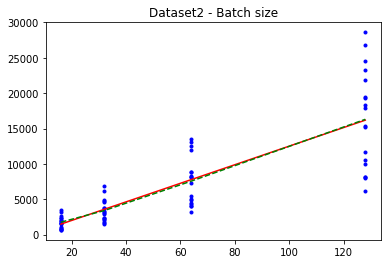

335.145888255986 555.4377998817663 0.4001392497254115 0.0004966073760433948 91.74545533461702


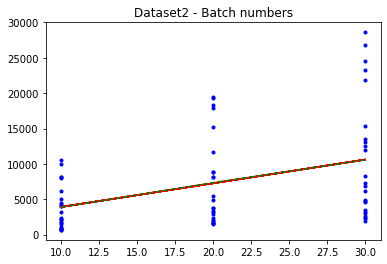

6.274864688962335 -271.482061753316 0.9617456412181928 4.271875234447748e-41 0.21362738776391332


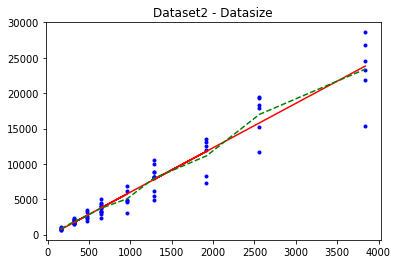

77.82483411872259 7076.764285391133 0.008482128324282022 0.9436246945578352 1096.6012121306828


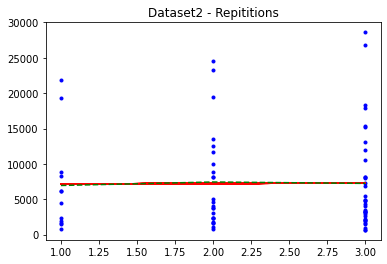

8.676051454772587 -20.009422678507804 0.9701264618453252 8.569630870622965e-45 0.2593194737135781


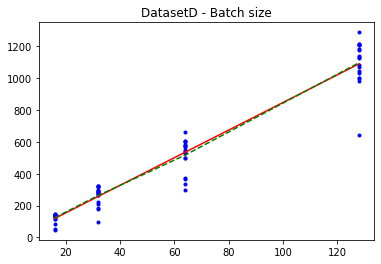

0.3242889563715438 494.0678854804165 0.006902141363786808 0.9541132290370998 5.615506627227257


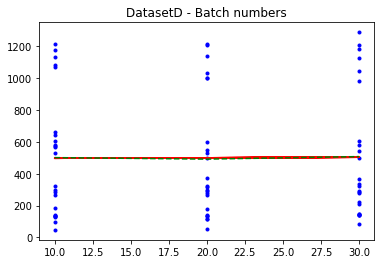

0.29487203250735955 146.70722559901594 0.8056824021794228 1.4087872210969905e-17 0.025911791160123737


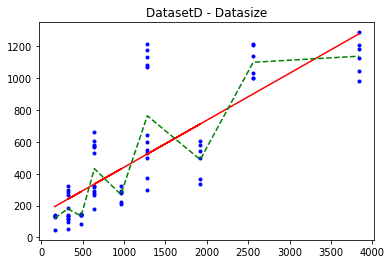

2.6530324376799856 494.3632555865941 0.00515470276631246 0.9657223576852546 61.51544107362578


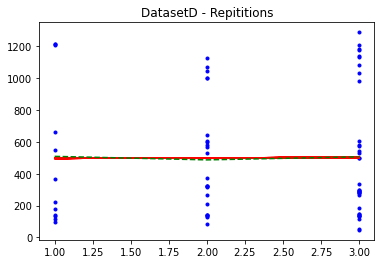

Dataset2 Batch Size Avg
[(16, 1758.338265599305), (32, 3409.955788151349), (64, 7568.460122440453), (128, 16296.668083814837)]
Dataset2 Numbers Avg
[(10, 3864.714624462815), (20, 7342.719680959109), (30, 10567.632389582535)]
Dataset2 Datasize Avg
[(160, 833.0647660267233), (320, 1842.7782354713524), (480, 2685.867843449278), (640, 3713.029320816507), (960, 5063.409679530291), (1280, 7945.750377407341), (1920, 11132.048580050323), (2560, 16993.556588270567), (3840, 23389.203455300245)]
Dataset2 Repititions Avg
[(1, 6945.819523023473), (2, 7441.183550114961), (3, 7240.648922251839)]
DatasetD Batch Size Avg
[(16, 124.15906716149925), (128, 1097.4347301411115), (64, 517.2050038825771), (32, 263.41585724620165)]
DatasetD Numbers Avg
[(10, 501.5351248928451), (20, 492.1049649104211), (30, 508.02090402027596)]
DatasetD Datasize Avg
[(2560, 1100.0706169263246), (480, 134.5771613774191), (1920, 488.9645014495033), (160, 121.24963588948913), (1280, 764.3137869376106), (3840, 1138.641443830403), 

In [ ]:
### CODING TASK ###
import scipy as sp
import numpy as np
from matplotlib import pyplot as plt

# https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.linregress.html
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html

### CODING TASK ###
import scipy as sp
import numpy as np
from matplotlib import pyplot as plt

# https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.linregress.html
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html

def linear_regression_adv (var_x, var_z, title):
  x = [x[0] for x in var_x] # get tuple first value and convert it into list columns
  y = [y[1] for y in var_x] # get tuple second value and convert it into list columns
  slope, intercept, r_value, p_value, std_err = sp.stats.linregress(np.array(x), np.array(y))
  print(slope, intercept, r_value, p_value, std_err)
  regression_line = intercept + slope * np.array(x)
  var_z_sort = sorted(var_z, key=lambda x: x[0]) # sort average value pairs for plotting
  var_z_sort_x = [x[0] for x in var_z_sort]
  var_z_sort_y = [y[1] for y in var_z_sort]
  plt.plot(x, y, 'b.')
  plt.plot(x, regression_line, 'r-')
  plt.plot(var_z_sort_x, var_z_sort_y, 'g--')
  plt.title(title)
  plt.show()

# Dataset2
# Batch size vs throughput
linear_regression_adv(output3[0], output3[8], 'Dataset2 - Batch size')

# Batch numbers 
linear_regression_adv(output3[1], output3[9], 'Dataset2 - Batch numbers')

# Datasize
linear_regression_adv(output3[2], output3[10], 'Dataset2 - Datasize')

# Repititions
linear_regression_adv(output3[3], output3[11], 'Dataset2 - Repititions')

# DatasetDecoded
# Batch size vs throughput
linear_regression_adv(output3[4], output3[12], 'DatasetD - Batch size')

# Batch numbers 
linear_regression_adv(output3[5], output3[13], 'DatasetD - Batch numbers')

# Datasize
linear_regression_adv(output3[6], output3[14], 'DatasetD - Datasize')

# Repititions
linear_regression_adv(output3[7], output3[15], 'DatasetD - Repititions')

## TABLES ##

# Dataset2 averages
# Batch size
print("Dataset2 Batch Size Avg")
print(output3[8])

# Batch numbers 
print("Dataset2 Numbers Avg")
print(output3[9])

# Datasize
print("Dataset2 Datasize Avg")
print(output3[10])

# Repititions
print("Dataset2 Repititions Avg")
print(output3[11])

# DatasetDecoded averages
# Batch size
print("DatasetD Batch Size Avg")
print(output3[12])

# Batch numbers 
print("DatasetD Numbers Avg")
print(output3[13])

# Datasize
print("DatasetD Datasize Avg")
print(output3[14])

# Repititions
print("DatasetD Repititions Avg")
print(output3[15])



## Task 3: Write TFRecord files to the cloud with Spark (20%)

This task of pre-processing images and creating TFRecord files is a more straightforward case of parallelisation. We will again use Spark.

### 3a)	Create the script (10%)

Re-Implement the code for creating the TFRecord files in Spark, using Spark mechanisms for distributing the workload over the shards. 

You need to copy over the mapping functions and adapt the resizing and recompression function to Spark (onyl one argument). (2%)
Replace the TensorFlow Dataset objects with RDDs, starting with an RDD that contains the list of image filenames. (2%)
Then use the mapping functions like with the TensorFlow Dataset object. (2%)

The code for writing to the TFRecord files needs to be put into a function, that can be applied to every partition with the ['RDD.mapPartitionsWithIndex'](https://spark.apache.org/docs/latest/api/python/pyspark.html#pyspark.RDD.mapPartitionsWithIndex) function. The return value of that function is not essential. You can return the filename, so that you have a list of the created TFRecord files. (4%) 



In [ ]:
# %%writefile spark_job_3a.py
### CODING TASK ###
## Write the images to TFRecord files with Spark

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
import pickle
import pyspark

from pyspark import sql
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
from pyspark.sql import Row

GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
SHARDS = 16 # shards are partitiones into shards
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']
    # labels for the data (folder names)
GCS_OUTPUT = BUCKET + '/tfrecords-jpeg-192x192-2/flowers'

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

def resize_and_crop_image(img_param): # accepting single argument img_param
  image = img_param[0]
  label = img_param[1]
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label

def recompress_image(img_param):
  image = img_param[0]
  label = img_param[1]
  height = tf.shape(image)[0]
  width = tf.shape(image)[1]
  image = tf.cast(image, tf.uint8)
  image = tf.image.encode_jpeg(image, optimize_size=True, chroma_downsampling=False)
  return image, label, height, width

def _bytestring_feature(list_of_bytestrings):
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=list_of_bytestrings))

def _int_feature(list_of_ints): # int64
  return tf.train.Feature(int64_list=tf.train.Int64List(value=list_of_ints))  

def to_tfrecord(tfrec_filewriter, img_bytes, label): #, height, width):  
  class_num = np.argmax(np.array(CLASSES)==label) # 'roses' => 2 (order defined in CLASSES)
  one_hot_class = np.eye(len(CLASSES))[class_num]     # [0, 0, 1, 0, 0] for class #2, roses
  feature = {
      "image": _bytestring_feature([img_bytes]), # one image in the list
      "class": _int_feature([class_num]) #,        # one class in the list
  }
  return tf.train.Example(features=tf.train.Features(feature=feature))

def write_to_tfrRecord_files(index, partitions):  
  filename = GCS_OUTPUT + "{:02d}.tfrec".format(index)
  with tf.io.TFRecordWriter(filename) as out_file:       
    for item in partitions:
      image = item[0]
      label = item[1]
      example = to_tfrecord(out_file,
                            image.numpy(), # re-compressed image: already a byte string
                            label.numpy() #, height.numpy()[i], width.numpy()[i]
                            )
      out_file.write(example.SerializeToString())        
  return [filename] 

print("Writing TFRecords")

sc = pyspark.SparkContext.getOrCreate()

tt_start = time.time()

filenames = tf.data.Dataset.list_files(GCS_PATTERN) 

data_rdd = sc.parallelize(filenames, SHARDS) # parallilize similar to example above with SHARDs = 16
data_decode_rdd = data_rdd.map(decode_jpeg_and_label)
data_resized_rdd = data_decode_rdd.map(resize_and_crop_image)
data_recompressed_rdd = data_resized_rdd.map(recompress_image)

data_repartition_rdd = data_recompressed_rdd.repartition(SHARDS)
print(data_recompressed_rdd.getNumPartitions())

files_mapPartition_rdd = data_repartition_rdd.mapPartitionsWithIndex(write_to_tfrRecord_files)
files_partitioned_list = files_mapPartition_rdd.collect()
print(files_partitioned_list)

tt_end = time.time()
total_time = tt_end - tt_start
print("Total time: " + str(total_time))

#if __name__ == '__main__':  
#  task_testing_3a()

Tensorflow version 2.4.1
Writing TFRecords
16
['gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers00.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers01.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers02.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers03.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers04.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers05.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers06.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers07.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers08.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers09.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers10.tfrec', 'gs://sylvan-surf-311408-storage/tfrecords-jpeg-192x192-2/flowers11.tfrec', 'gs://sylvan-surf-311408-storage/tfrecord

### 3b)	Run and test (2%)

Run the script and test the output. Demonstrate that the files you wrote with your spark job work can be read and used by the model training. 

In [ ]:
!gcloud dataproc clusters create $CLUSTER \
  --image-version 1.4-ubuntu18 --single-node \
  --master-machine-type n1-standard-2 \
  --master-boot-disk-type pd-ssd --master-boot-disk-size 100 \
  --initialization-actions gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh \
  --metadata PIP_PACKAGES=tensorflow==2.1.0 \
  --bucket $PROJECT-storage \
  --max-idle 3600s

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/69eb9a7c-37fe-33d2-b325-cc2eea03bd8c].
Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


In [ ]:
%%writefile spark_job_3a.py
### CODING TASK ###
## Write the images to TFRecord files with Spark

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
import pickle
import pyspark

from pyspark import sql
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
from pyspark.sql import Row

GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
SHARDS = 16 # shards are partitiones into shards
TARGET_SIZE = [192, 192] # the resolution for the images
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']
    # labels for the data (folder names)
PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)
GCS_OUTPUT = BUCKET + '/tfrecords-jpeg-192x192-2/flowers'

def decode_jpeg_and_label(filepath):
    bits = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(bits)
    # parse flower name from containing directory
    label = tf.strings.split(tf.expand_dims(filepath, axis=-1), sep='/')
    label2 = label.values[-2]
    return image, label2

def resize_and_crop_image(img_param):
  image = img_param[0]
  label = img_param[1]
  # Resize and crop using "fill" algorithm:
  # always make sure the resulting image
  # is cut out from the source image so that
  # it fills the TARGET_SIZE entirely with no
  # black bars and a preserved aspect ratio.
  w = tf.shape(image)[0]
  h = tf.shape(image)[1]
  tw = TARGET_SIZE[1]
  th = TARGET_SIZE[0]
  resize_crit = (w * th) / (h * tw)
  image = tf.cond(resize_crit < 1,
                  lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                  lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                 )
  nw = tf.shape(image)[0]
  nh = tf.shape(image)[1]
  image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
  return image, label

def recompress_image(img_param):
  image = img_param[0]
  label = img_param[1]
  height = tf.shape(image)[0]
  width = tf.shape(image)[1]
  image = tf.cast(image, tf.uint8)
  image = tf.image.encode_jpeg(image, optimize_size=True, chroma_downsampling=False)
  return image, label, height, width

def _bytestring_feature(list_of_bytestrings):
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=list_of_bytestrings))

def _int_feature(list_of_ints): # int64
  return tf.train.Feature(int64_list=tf.train.Int64List(value=list_of_ints))  

def to_tfrecord(tfrec_filewriter, img_bytes, label): #, height, width):  
  class_num = np.argmax(np.array(CLASSES)==label) # 'roses' => 2 (order defined in CLASSES)
  one_hot_class = np.eye(len(CLASSES))[class_num]     # [0, 0, 1, 0, 0] for class #2, roses
  feature = {
      "image": _bytestring_feature([img_bytes]), # one image in the list
      "class": _int_feature([class_num]) #,        # one class in the list
  }
  return tf.train.Example(features=tf.train.Features(feature=feature))

def write_to_tfrRecord_files(index, partitions):  
  filename = GCS_OUTPUT + "{:02d}.tfrec".format(index)
  with tf.io.TFRecordWriter(filename) as out_file:       
    for item in partitions:
      image = item[0]
      label = item[1]
      example = to_tfrecord(out_file,
                            image.numpy(), # re-compressed image: already a byte string
                            label.numpy() #, height.numpy()[i], width.numpy()[i]
                            )
      out_file.write(example.SerializeToString())        
  return [filename] 

if __name__ == '__main__':  
  print("Writing TFRecords")

  sc = pyspark.SparkContext.getOrCreate()

  tt_start = time.time()

  filenames = tf.data.Dataset.list_files(GCS_PATTERN) 

  data_rdd = sc.parallelize(filenames, SHARDS)
  data_decode_rdd = data_rdd.map(decode_jpeg_and_label)
  data_resized_rdd = data_decode_rdd.map(resize_and_crop_image)
  data_recompressed_rdd = data_resized_rdd.map(recompress_image)

  data_repartition_rdd = data_recompressed_rdd.repartition(SHARDS)
  print(data_recompressed_rdd.getNumPartitions())

  files_mapPartition_rdd = data_repartition_rdd.mapPartitionsWithIndex(write_to_tfrRecord_files)
  files_partitioned_list = files_mapPartition_rdd.collect()
  print(files_partitioned_list)

  tt_end = time.time()
  total_time = tt_end - tt_start
  print("Total time: " + str(total_time))

Writing spark_job_3a.py


In [ ]:
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./spark_job_3a.py

Job [9d97fe86291c4890a7203b5128728a87] submitted.
Waiting for job output...
2021-04-24 23:24:42.082062: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-24 23:24:42.082256: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-24 23:24:42.082274: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Tensorflow version 2.1.0
Writing TFRecords
21/04/24 23:24:44 INFO org.spark_project.jetty.util.log: Logging initi

Read from the TFRecord Dataset to test. 


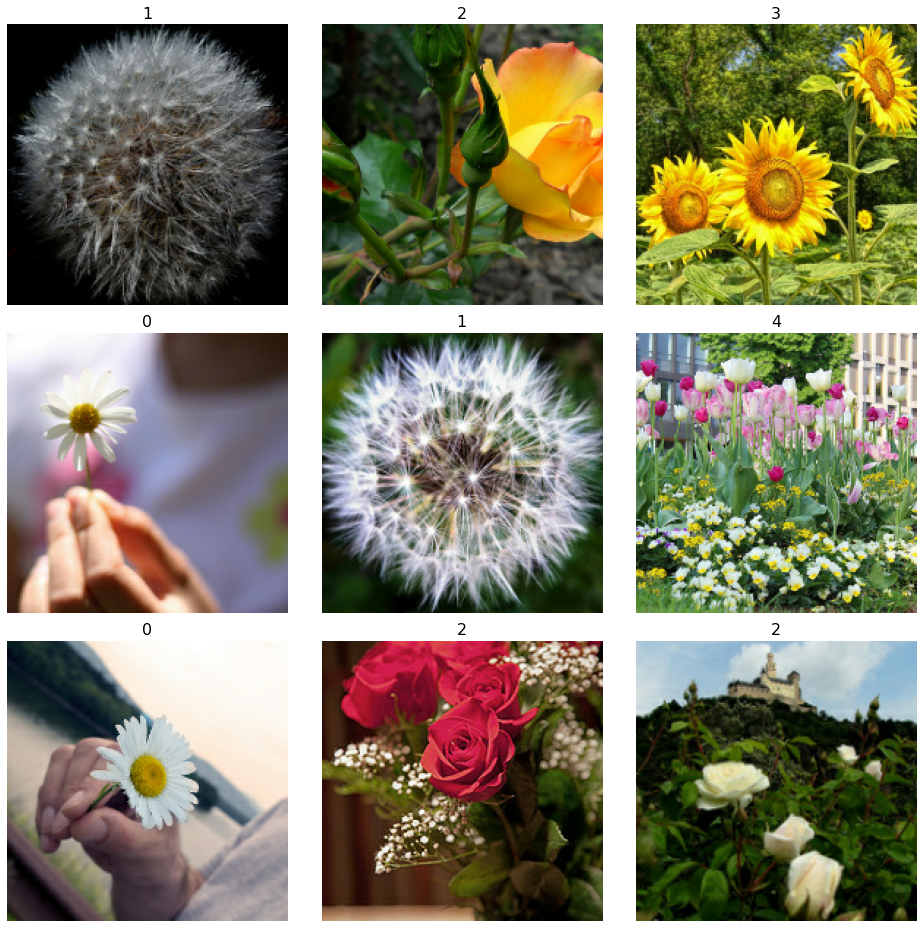

In [ ]:
### CODING TASK ###
GCS_OUTPUT = BUCKET + '/tfrecords-jpeg-192x192-2/'

def load_dataset(filenames):
    # read from TFRecords. For optimal performance, read from multiple    
    # TFRecord files at once and set the option experimental_deterministic = False
    # to allow order-altering optimizations.
    option_no_order = tf.data.Options()
    option_no_order.experimental_deterministic = False

    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.with_options(option_no_order)
    dataset = dataset.map(read_tfrecord)
    return dataset

#Reading from newly written TF record files   
filenames = tf.io.gfile.glob(GCS_OUTPUT + "*.tfrec")
dataset_read_from_bucketTF = load_dataset(filenames)
display_9_images_from_dataset(dataset_read_from_bucketTF)

In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/b769b82e-410d-3101-a161-a21105b8f16f].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


### 3c)	Experiment and discussion (8%)

i) Explain the difference between this use of Spark and most standard applications like e.g. in our labs. (2%)

ii)	Test your program with 4 machines with double the resources each (2 vCPUs, memory, disk) and 1 machine with 8-fold resources (8 vCPUs). Discuss the results in terms of disk I/O and network bandwidth allocation in the cloud. (6%)

Write your answers in your report.

In [ ]:
### CODING TASK ###
CLUSTER = '{}-cluster'.format(PROJECT)
!gcloud dataproc clusters create $CLUSTER \
  --image-version 1.4-ubuntu18 \
  --master-machine-type n1-standard-2 \
  --master-boot-disk-type pd-ssd --master-boot-disk-size 100 \
  --num-workers 3 --worker-machine-type n1-standard-2 --worker-boot-disk-size 285 \
  --initialization-actions gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh \
  --metadata PIP_PACKAGES=tensorflow==2.1.0 \
  --bucket $PROJECT-storage \
  --max-idle 3600s

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/cabb07bd-1df7-322b-8b54-eeb7b462d3f6].

Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


In [ ]:
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./spark_job_3a.py

Job [e897a4fdd0be4bf1814f8ce2df404860] submitted.
Waiting for job output...
2021-04-25 12:27:18.443722: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 12:27:18.443946: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 12:27:18.443964: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Tensorflow version 2.1.0
Writing TFRecords
21/04/25 12:27:21 INFO org.spark_project.jetty.util.log: Logging initi

In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/f084ad10-2674-3e3d-b674-07fa8bcb56b3].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


In [ ]:
!gcloud dataproc clusters create $CLUSTER \
  --image-version 1.4-ubuntu18 \
  --master-machine-type n1-standard-8 \
  --master-boot-disk-type pd-ssd --master-boot-disk-size 100 \
  --num-workers 0 \
  --initialization-actions gs://goog-dataproc-initialization-actions-$REGION/python/pip-install.sh \
  --metadata PIP_PACKAGES=tensorflow==2.1.0 \
  --bucket $PROJECT-storage \
  --max-idle 3600s

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/13d862de-281f-3ace-957a-f52e7fa7c8de].
Created [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster] Cluster placed in zone [us-central1-f].


In [ ]:
!gcloud dataproc jobs submit pyspark --cluster $CLUSTER --region $REGION \
    ./spark_job_3a.py

Job [5878e0f22139421f949df772be12ceaf] submitted.
Waiting for job output...
2021-04-25 12:11:14.503064: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 12:11:14.503209: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/usr/lib/hadoop/lib/native
2021-04-25 12:11:14.503220: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Tensorflow version 2.1.0
Writing TFRecords
21/04/25 12:11:16 INFO org.spark_project.jetty.util.log: Logging initi

In [ ]:
!gcloud dataproc clusters delete $CLUSTER -q 

Waiting on operation [projects/sylvan-surf-311408/regions/us-central1/operations/1783ca36-22c0-37e5-b4d1-98ab880ae157].
Deleted [https://dataproc.googleapis.com/v1/projects/sylvan-surf-311408/regions/us-central1/clusters/sylvan-surf-311408-cluster].


# Section 2: Machine Learning in the Cloud

In this section we will use the pre-processed data with the GC AI-Platform for Machine Learning. 

## Preparation: Machine Learning Setup

As in Section 1, In this section, we get started based on  code from the 'Fast and Lean Data Science' course, this time lecture 4, to establish the task.


### Create Train and Test Sets 

We will first set up a few variables for the machine learning and then run split the test and training sets. 

In [ ]:
BATCH_SIZE = 64 # this is a good setting for the Colab GPU (K80)
#BATCH_SIZE = 128 # works on newer GPUs with more memory (available on GCS AI-Platform) 
EPOCHS = 5 # this value is for testing. Increase later 
GCS_TFR_PATTERN = 'gs://flowers-public/tfrecords-jpeg-192x192-2/*.tfrec' 
# this is a link to public data, use your own later
#GCS_TFR_PATTERN = 'gs://bd-cw-2-bucket/tfrecords-jpeg-192x192-2/flowers*.tfrec' 

TARGET_SIZE = [192,192]

VALIDATION_SPLIT = 0.25

CLASSES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips'] # maps class numbers to labels strings

SAMPLE_NUM=3670 # size of the Flowers dataset, change as appropriate for smaller samples/different datasets


In [ ]:
# splitting data files between training and validation
filenames = tf.io.gfile.glob(GCS_TFR_PATTERN)
print("len(filenames): "+str(len(filenames)))
split = int(len(filenames) * VALIDATION_SPLIT)
training_filenames = filenames[split:]
validation_filenames = filenames[:split]
print("Pattern matches {} data files. Splitting dataset into {} training files and {} validation files".format(len(filenames), len(training_filenames), len(validation_filenames)))
validation_steps = int(SAMPLE_NUM // len(filenames) * len(validation_filenames)) // BATCH_SIZE
steps_per_epoch = int(SAMPLE_NUM // len(filenames) * len(training_filenames)) // BATCH_SIZE
print("With a batch size of {}, there will be {} batches per training epoch and {} batch(es) per validation run.".format(BATCH_SIZE, steps_per_epoch, validation_steps))


len(filenames): 16
Pattern matches 16 data files. Splitting dataset into 12 training files and 4 validation files
With a batch size of 64, there will be 42 batches per training epoch and 14 batch(es) per validation run.


In [ ]:
def get_batched_dataset(filenames, train=False):
  dataset = load_dataset(filenames)
  dataset = dataset.cache() # This dataset fits in RAM
  if train:
    # Best practices for Keras:
    # Training dataset: repeat then batch
    # Evaluation dataset: do not repeat
    dataset = dataset.repeat()
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
  # should shuffle too but this dataset was well shuffled on disk already
  return dataset
  # source: Dataset performance guide: https://www.tensorflow.org/guide/performance/datasets

# instantiate the datasets
training_dataset = get_batched_dataset(training_filenames, train=True)
validation_dataset = get_batched_dataset(validation_filenames, train=False)

In [ ]:
sample_set = training_dataset.take(4)
for image, label in sample_set: 
    print("Image batch shape {}, {})".format(image.numpy().shape, \
                        [str(lbl) for lbl in label.numpy()]))

Image batch shape (64, 192, 192, 3), ['1', '0', '0', '3', '3', '0', '0', '2', '2', '4', '1', '4', '4', '3', '3', '0', '1', '2', '4', '1', '2', '3', '2', '2', '1', '0', '4', '2', '0', '0', '1', '4', '4', '1', '4', '0', '1', '3', '1', '1', '0', '0', '0', '1', '4', '0', '3', '0', '2', '3', '4', '1', '2', '2', '1', '2', '2', '4', '4', '0', '0', '3', '4', '2'])
Image batch shape (64, 192, 192, 3), ['3', '1', '1', '0', '3', '3', '1', '2', '2', '3', '1', '4', '0', '0', '1', '2', '1', '0', '4', '3', '1', '4', '4', '2', '1', '0', '4', '3', '4', '2', '0', '1', '4', '0', '2', '4', '0', '0', '1', '2', '0', '2', '1', '4', '0', '4', '1', '3', '1', '1', '1', '0', '1', '3', '4', '2', '2', '2', '4', '1', '2', '0', '3', '2'])
Image batch shape (64, 192, 192, 3), ['1', '3', '4', '4', '2', '2', '0', '2', '0', '2', '0', '1', '1', '1', '0', '1', '4', '1', '1', '2', '4', '0', '0', '1', '4', '0', '1', '1', '4', '1', '1', '2', '1', '3', '3', '4', '2', '0', '3', '4', '0', '0', '3', '2', '2', '4', '0', '1', '2',

### Set up a pretrained model

In [ ]:
pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*TARGET_SIZE, 3], include_top=False)
pretrained_model.trainable = False

model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100,activation='relu'),
    tf.keras.layers.Dropout(.5),
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

9412608/9406464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_192 (Functi (None, 6, 6, 1280)        2257984   
_________________________________________________________________
flatten (Flatten)            (None, 46080)             0         
_________________________________________________________________
dense (Dense)                (None, 100)               4608100   
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 5)                 505       
Total params: 6,866,589
Trainable params: 4,608,605
Non-trainable params: 2,257,984
_________________________________________________________________


### Local Training

In [ ]:
tt0 = time.time()
history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=validation_dataset, validation_steps=validation_steps)
tt = time.time() - tt0
print("Wall clock time = {}".format(tt))

Epoch 1/5
42/42 [==============================] - 90s 2s/step - loss: 5.3269 - accuracy: 0.2389 - val_loss: 1.6076 - val_accuracy: 0.2500
Epoch 2/5
42/42 [==============================] - 84s 2s/step - loss: 1.5998 - accuracy: 0.2726 - val_loss: 1.6035 - val_accuracy: 0.2489
Epoch 3/5
42/42 [==============================] - 84s 2s/step - loss: 1.6006 - accuracy: 0.2817 - val_loss: 1.5718 - val_accuracy: 0.3170
Epoch 4/5
42/42 [==============================] - 84s 2s/step - loss: 1.5864 - accuracy: 0.2784 - val_loss: 1.5900 - val_accuracy: 0.2824
Epoch 5/5
42/42 [==============================] - 84s 2s/step - loss: 1.5649 - accuracy: 0.3066 - val_loss: 1.5914 - val_accuracy: 0.2589
Wall clock time = 425.01321506500244


Result: Training time

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


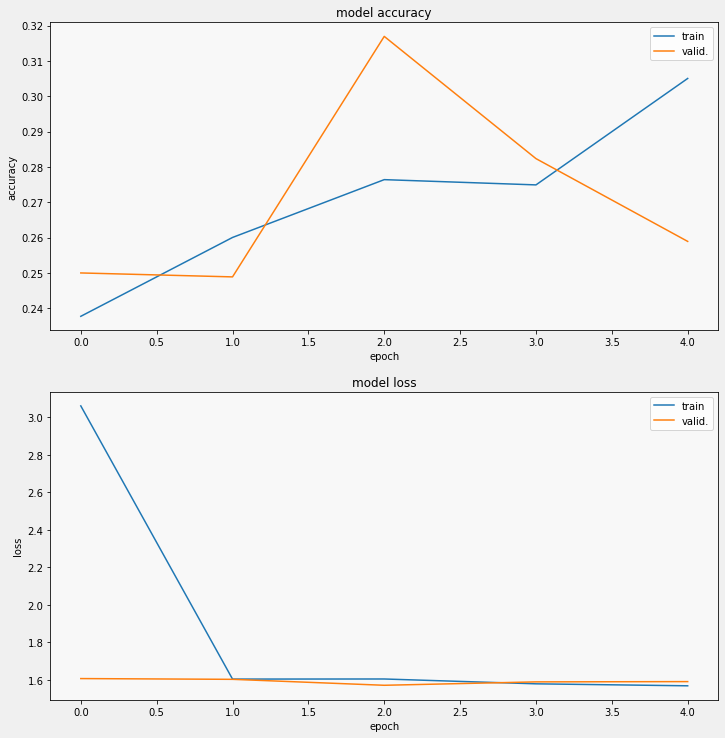

In [ ]:
print(history.history.keys())
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

In [ ]:
# random input: execute multiple times to change results
flowers, labels = dataset_to_numpy_util(load_dataset(validation_filenames).skip(np.random.randint(300)), 9)

predictions = model.predict(flowers, steps=1)
print(np.array(CLASSES)[np.argmax(predictions, axis=-1)].tolist())

['dandelion', 'tulips', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion', 'dandelion']


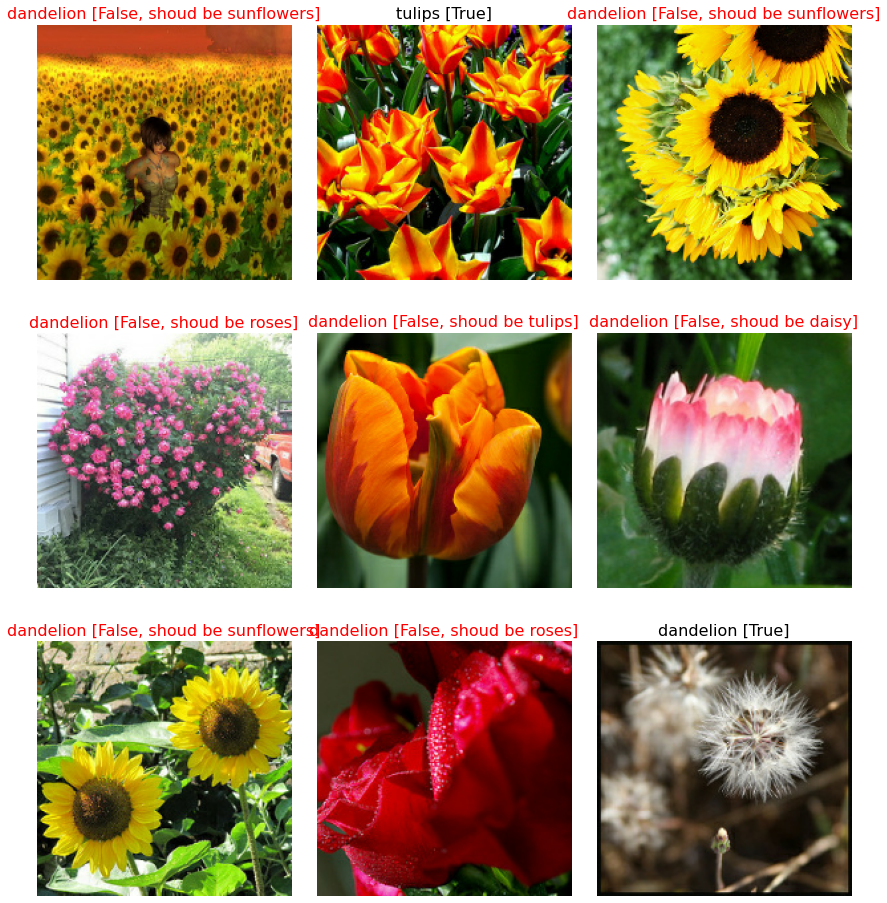

In [ ]:
display_9_images_with_predictions(flowers, predictions, labels)

## Task 4: Machine learning in the cloud (20%)

### 4a) Create the package and code for the AI-Platform (7%)

The AI Platform needs code in a 'package'. 
The package can contain complex software systems and extensive  information on the setup. 
We will keep the package as simple as possible here.



i) The minimal 'package' in Python needs a directory with two modules (i.e. Python files). 
Create a directory 'trainer' and then an empty file `trainer/__init__.py`. 
This can be done by using the command line tool `touch`. 
Check that the file exists. (1%) 

In [ ]:
### CODING TASK ###

!mkdir trainer
!touch trainer/__init__.py
!ls -lh trainer

total 0
-rw-r--r-- 1 root root 0 Apr 25 06:29 __init__.py


ii) The other file we need is the modlue with the training code, which we will call `task.py`. 

We can build this file by combining the last few cells under 'Machine Learning Setup' into one file, almost literally. 

Then, we need to save the model itself and the training history into a file after training. 
The `history` object returned by `model.fit` can not be pickled, but it's data in `history.history` can. 
For saving the model, use `model.save()`.
Write the necessary code, like in section 2 when preparing jobs for Spark/DataProc.

If you use argparse as in section 2 (recommended), then you need to add an argument `--job-dir` that will be passed through from the AI-Platform to your program.
(6%)

In [ ]:
%%writefile trainer/task.py
### CODING TASK ###

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
import pickle

AUTO = tf.data.experimental.AUTOTUNE # used in tf.data.Dataset API

PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)

BATCH_SIZE = 64 # this is a good setting for the Colab GPU (K80)
#BATCH_SIZE = 128 # works on newer GPUs with more memory (available on GCS AI-Platform) 
EPOCHS = 5 # this value is for testing. Increase later 
GCS_TFR_PATTERN = 'gs://flowers-public/tfrecords-jpeg-192x192-2/*.tfrec' 
# this is a link to public data, use your own later
#GCS_TFR_PATTERN = BUCKET + '/tfrecords-jpeg-192x192-2/flowers*.tfrec' 

TARGET_SIZE = [192,192]
VALIDATION_SPLIT = 0.25
CLASSES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips'] # maps class numbers to labels strings
SAMPLE_NUM=3670 # size of the Flowers dataset, change as appropriate for smaller samples/different datasets

def get_batched_dataset(filenames, train=False):
  dataset = load_dataset(filenames)
  dataset = dataset.cache() # This dataset fits in RAM
  if train:
    # Best practices for Keras:
    # Training dataset: repeat then batch
    # Evaluation dataset: do not repeat
    dataset = dataset.repeat()
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
  # should shuffle too but this dataset was well shuffled on disk already
  return dataset
  # source: Dataset performance guide: https://www.tensorflow.org/guide/performance/datasets

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def save(object,bucket,filename):
  with open(filename,mode='ab') as f:
      pickle.dump(object,f)
  print("Saving {} to {}".format(filename,bucket))
  import subprocess
  proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
  print("gstuil returned: " + str(proc.returncode))
  print(str(proc.stderr))

def deep_learning_ai_platform(argv):
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # splitting data files between training and validation
  filenames = tf.io.gfile.glob(GCS_TFR_PATTERN)
  print("len(filenames): "+str(len(filenames)))
  split = int(len(filenames) * VALIDATION_SPLIT)
  training_filenames = filenames[split:]
  validation_filenames = filenames[:split]
  print("Pattern matches {} data files. Splitting dataset into {} training files and {} validation files".format(len(filenames), len(training_filenames), len(validation_filenames)))
  validation_steps = int(SAMPLE_NUM // len(filenames) * len(validation_filenames)) // BATCH_SIZE
  steps_per_epoch = int(SAMPLE_NUM // len(filenames) * len(training_filenames)) // BATCH_SIZE
  print("With a batch size of {}, there will be {} batches per training epoch and {} batch(es) per validation run.".format(BATCH_SIZE, steps_per_epoch, validation_steps))

  # instantiate the datasets
  training_dataset = get_batched_dataset(training_filenames, train=True)
  validation_dataset = get_batched_dataset(validation_filenames, train=False)

  pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*TARGET_SIZE, 3], include_top=False)
  pretrained_model.trainable = False

  model = tf.keras.Sequential([
      pretrained_model,
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(100,activation='relu'),
      tf.keras.layers.Dropout(.5),
      tf.keras.layers.Dense(5, activation='softmax')
  ])

  model.compile(
      optimizer='adam',
      loss = 'sparse_categorical_crossentropy',
      metrics=['accuracy']
  )

  model.summary()

  tt0 = time.time()
  history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                      validation_data=validation_dataset, validation_steps=validation_steps)
  tt = time.time() - tt0
  print("Wall clock time = {}".format(tt))

  save(history.history, args.out_bucket, args.out_file)
  save(tt, args.out_bucket, args.out_file)
  model.save(BUCKET) # save model

if __name__ == '__main__':
  FILENAME = 'task_4a_deeplearning_results.pkl'
  PROJECT = 'sylvan-surf-311408'
  BUCKET = 'gs://{}-storage'.format(PROJECT)
  deep_learning_ai_platform(["--out_bucket", BUCKET, "--out_file", FILENAME])


Writing trainer/task.py


In [ ]:
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_1" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

!gcloud ai-platform local train \
    --job-dir $JOB_DIR  \
    --package-path $TRAINER_PACKAGE_PATH \
    --module-name $MAIN_TRAINER_MODULE \
    -- --config standard_gpu --batch-size 32

2021-04-25 06:30:14.000290: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Tensorflow version 2.4.1
['--out_bucket', 'gs://sylvan-surf-311408-storage', '--out_file', 'task_4a_deeplearning_results.pkl']
len(filenames): 16
Pattern matches 16 data files. Splitting dataset into 12 training files and 4 validation files
With a batch size of 64, there will be 42 batches per training epoch and 14 batch(es) per validation run.
2021-04-25 06:30:16.866597: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-04-25 06:30:16.867708: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-04-25 06:30:16.881053: E tensorflow/stream_executor/cuda/cuda_driver.cc:328] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-04-25 06:30:16.881110: I tensorflow/stream_executor/cuda/cuda_d

### 4b) Run the Training on the AI-Platform and view the Output (3%)

Now, with all code in place, we can submit the package. AI-Platform is serverless, therefore we don't need to create a cluster ourselves, but we just submit a job and the master and workers will be set up automatically. 
Find [here](https://cloud.google.com/sdk/gcloud/reference/ai-platform/jobs/submit/training) the information how to submit a training job in GCS AI-Platform.  

The job will wait in a queue before it gets executed, this can take several minutes (at least on free credits). 
It's therefore a good idea to test the script locally before you submit to the cloud. 

You can, however, get powerful hardware. Up to 30 K80 or even P100 GPUs are available, but not all configurations are possible. 
Check [here](https://cloud.google.com/ai-platform/training/docs/quotas#gpu-quota) and [here](https://cloud.google.com/ai-platform/training/docs/using-gpus), and test [here on the console](https://console.cloud.google.com/ai-platform/create-job/custom-code?folder=true&organizationId=true) with the Create option whether your configuration works in the Google Cloud.


In [ ]:
# 1 K80 GPU
# AI Platform parameters
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_4" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

### CODING TASK ### 
!gcloud ai-platform jobs submit training $JOB_NAME \
  --staging-bucket $PACKAGE_STAGING_PATH \
  --job-dir $JOB_DIR  \
  --region $REGION  \
  --package-path $TRAINER_PACKAGE_PATH \
  --module-name $MAIN_TRAINER_MODULE \
  --runtime-version 2.3 \
  --python-version 3.7 \
  --scale-tier custom \
  --master-machine-type standard_gpu \
  --stream-logs

Job [flowers_training_dl_4] submitted successfully.
INFO	2021-04-25 06:38:56 +0000	service		Validating job requirements...
INFO	2021-04-25 06:38:57 +0000	service		Job creation request has been successfully validated.
INFO	2021-04-25 06:38:57 +0000	service		Waiting for job to be provisioned.
INFO	2021-04-25 06:38:57 +0000	service		Job flowers_training_dl_4 is queued.
INFO	2021-04-25 06:38:58 +0000	service		Waiting for training program to start.
INFO	2021-04-25 06:45:31 +0000	master-replica-0		Using mount point: /gcs
NOTICE	2021-04-25 06:45:31 +0000	master-replica-0		Opening GCS connection...
INFO	2021-04-25 06:45:31 +0000	master-replica-0		Set up root directory for all accessible buckets
NOTICE	2021-04-25 06:45:31 +0000	master-replica-0		Mounting file system "gcsfuse"...
NOTICE	2021-04-25 06:45:31 +0000	master-replica-0		File system has been successfully mounted.
INFO	2021-04-25 06:48:09 +0000	master-replica-0		Running task with arguments: --cluster={"chief": ["127.0.0.1:2222"]} --task=

In [ ]:
# 8 K80 GPU
# AI Platform parameters
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_5" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

### CODING TASK ### 
!gcloud ai-platform jobs submit training $JOB_NAME \
  --staging-bucket $PACKAGE_STAGING_PATH \
  --job-dir $JOB_DIR  \
  --region $REGION  \
  --package-path $TRAINER_PACKAGE_PATH \
  --module-name $MAIN_TRAINER_MODULE \
  --runtime-version 2.3 \
  --python-version 3.7 \
  --scale-tier custom \
  --master-machine-type complex_model_l_gpu \
  --stream-logs

Job [flowers_training_dl_5] submitted successfully.
INFO	2021-04-25 06:57:32 +0000	service		Validating job requirements...
INFO	2021-04-25 06:57:33 +0000	service		Job creation request has been successfully validated.
INFO	2021-04-25 06:57:33 +0000	service		Waiting for job to be provisioned.
INFO	2021-04-25 06:57:33 +0000	service		Job flowers_training_dl_5 is queued.
INFO	2021-04-25 06:57:34 +0000	service		Waiting for training program to start.
INFO	2021-04-25 07:01:37 +0000	master-replica-0		Using mount point: /gcs
NOTICE	2021-04-25 07:01:37 +0000	master-replica-0		Opening GCS connection...
INFO	2021-04-25 07:01:37 +0000	master-replica-0		Set up root directory for all accessible buckets
NOTICE	2021-04-25 07:01:37 +0000	master-replica-0		Mounting file system "gcsfuse"...
NOTICE	2021-04-25 07:01:37 +0000	master-replica-0		File system has been successfully mounted.
INFO	2021-04-25 07:09:12 +0000	master-replica-0		Running task with arguments: --cluster={"chief": ["127.0.0.1:2222"]} --task=

In [ ]:
!gcloud ai-platform jobs stream-logs $JOB_NAME

After training, plot the accuracy and loss curves based on the saved history.

In [ ]:
### CODING TASK ### 

!gsutil cp $BUCKET/task_4a_deeplearning_results.pkl . 
with open("task_4a_deeplearning_results.pkl",mode='rb') as f:
    model_history = pickle.load(f)
    total_timing = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_4a_deeplearning_results.pkl...
/ [1 files][  280.0 B/  280.0 B]                                                
Operation completed over 1 objects/280.0 B.                                      


In [ ]:
print(model_history)
print(total_timing)

{'loss': [3.180168628692627, 1.613197922706604, 1.599342942237854, 1.5846575498580933, 1.5917654037475586], 'accuracy': [0.2548363208770752, 0.277157723903656, 0.2526041567325592, 0.263764888048172, 0.2570684552192688], 'val_loss': [1.5865957736968994, 1.5933705568313599, 1.594833493232727, 1.5813511610031128, 1.585910439491272], 'val_accuracy': [0.2488839328289032, 0.2399553507566452, 0.2421875, 0.2611607015132904, 0.2444196492433548]}
35.17931532859802


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


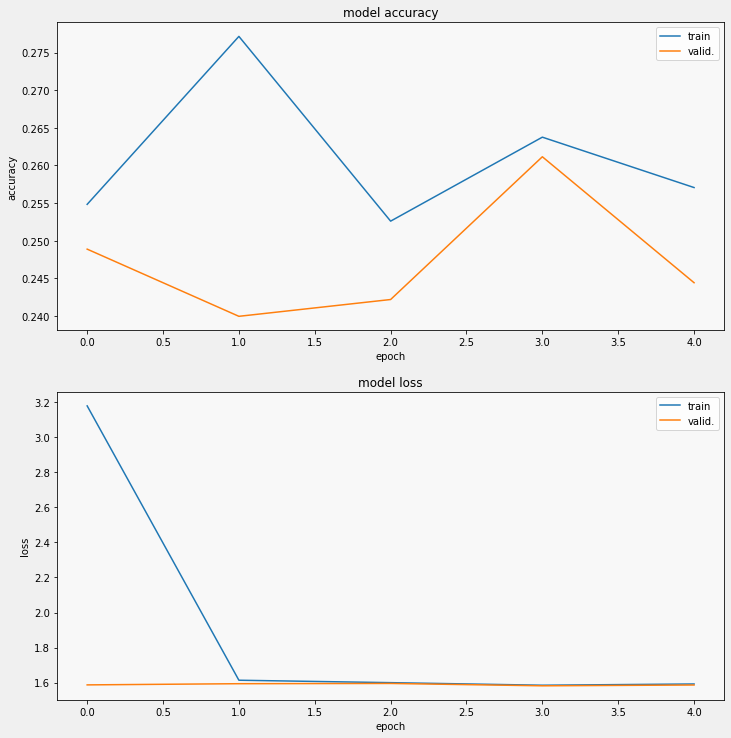

In [ ]:
print(model_history.keys())
display_training_curves(model_history['accuracy'], model_history['val_accuracy'], 'accuracy', 211)
display_training_curves(model_history['loss'], model_history['val_loss'], 'loss', 212)

### 4c) Distributed learning	(10%)

Apply a distributed learning strategy to the code (see https://www.tensorflow.org/tutorials/distribute/multi_worker_with_keras?hl=nb#choose_the_right_strategy for an example ).  
Add the necessary changes to the code.

Experiment with different strategies and batch sizes. Report and interpret your results. 
For the defining cluster sizes, you can use command line options as described here: https://cloud.google.com/ai-platform/training/docs/machine-types#legacy-machine-types . 
Check the pricing here ( https://cloud.google.com/ai-platform/training/pricing ) and make sure everything works before you run jobs on the expensive configurations. 

The machines with P100 and V100 GPUs are quite expensive. 
For the experiments here, the `standard_gpu` (1xK80) and the `complex_model_l_gpu` (8xK80) are sufficient.

In [ ]:
### CODING TASK ### 

# Multi worker mirrored strategy - 1 master 8 K80 and 1 worker 8 K80

%%writefile trainer/task.py
### CODING TASK ###

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
import pickle
import json
import os

AUTO = tf.data.experimental.AUTOTUNE # used in tf.data.Dataset API

PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)

#BATCH_SIZE = 64 # this is a good setting for the Colab GPU (K80)
BATCH_SIZE = 128 # works on newer GPUs with more memory (available on GCS AI-Platform) 
EPOCHS = 5 # this value is for testing. Increase later 
GCS_TFR_PATTERN = 'gs://flowers-public/tfrecords-jpeg-192x192-2/*.tfrec' 
# this is a link to public data, use your own later
#GCS_TFR_PATTERN = BUCKET + '/tfrecords-jpeg-192x192-2/flowers*.tfrec' 

TARGET_SIZE = [192,192]
VALIDATION_SPLIT = 0.25
CLASSES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips'] # maps class numbers to labels strings
SAMPLE_NUM=3670 # size of the Flowers dataset, change as appropriate for smaller samples/different datasets

# Multi worker mirrored startegy
strategy = tf.distribute.MultiWorkerMirroredStrategy()

# Config dump - https://cloud.google.com/ai-platform/training/docs/distributed-training-details
tf_config_str = os.environ.get('TF_CONFIG')
tf_config_dict  = json.loads(tf_config_str)

# Convert back to string just for pretty printing
print(json.dumps(tf_config_dict, indent=2))

def get_batched_dataset(filenames, train=False):
  dataset = load_dataset(filenames)
  dataset = dataset.cache() # This dataset fits in RAM
  if train:
    # Best practices for Keras:
    # Training dataset: repeat then batch
    # Evaluation dataset: do not repeat
    dataset = dataset.repeat()
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
  # should shuffle too but this dataset was well shuffled on disk already
  return dataset
  # source: Dataset performance guide: https://www.tensorflow.org/guide/performance/datasets

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def save(object,bucket,filename):
  with open(filename,mode='ab+') as f:
      pickle.dump(object,f)
  print("Saving {} to {}".format(filename,bucket))
  import subprocess
  proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
  print("gstuil returned: " + str(proc.returncode))
  print(str(proc.stderr))

def deep_learning_ai_platform(argv):
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # splitting data files between training and validation
  filenames = tf.io.gfile.glob(GCS_TFR_PATTERN)
  print("len(filenames): "+str(len(filenames)))
  split = int(len(filenames) * VALIDATION_SPLIT)
  training_filenames = filenames[split:]
  validation_filenames = filenames[:split]
  print("Pattern matches {} data files. Splitting dataset into {} training files and {} validation files".format(len(filenames), len(training_filenames), len(validation_filenames)))
  validation_steps = int(SAMPLE_NUM // len(filenames) * len(validation_filenames)) // BATCH_SIZE
  steps_per_epoch = int(SAMPLE_NUM // len(filenames) * len(training_filenames)) // BATCH_SIZE
  print("With a batch size of {}, there will be {} batches per training epoch and {} batch(es) per validation run.".format(BATCH_SIZE, steps_per_epoch, validation_steps))

  # instantiate the datasets
  training_dataset = get_batched_dataset(training_filenames, train=True)
  validation_dataset = get_batched_dataset(validation_filenames, train=False)

  with strategy.scope():
    pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*TARGET_SIZE, 3], include_top=False)
    pretrained_model.trainable = False

    model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(100,activation='relu'),
        tf.keras.layers.Dropout(.5),
        tf.keras.layers.Dense(5, activation='softmax')
    ])

    model.compile(
        optimizer='adam',
        loss = 'sparse_categorical_crossentropy',
        metrics=['accuracy']
    )     

  tt0 = time.time()
  history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                      validation_data=validation_dataset, validation_steps=validation_steps)
  tt = time.time() - tt0
  print("Wall clock time = {}".format(tt))
  print(history.history)

  save(history.history, args.out_bucket, args.out_file)
  save(tt, args.out_bucket, args.out_file)

if __name__ == '__main__':
  FILENAME = 'task_4a_deeplearning_results.pkl'
  PROJECT = 'sylvan-surf-311408'
  BUCKET = 'gs://{}-storage'.format(PROJECT)
  deep_learning_ai_platform(["--out_bucket", BUCKET, "--out_file", FILENAME])

Overwriting trainer/task.py


In [ ]:
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_1" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

!gcloud ai-platform local train \
    --job-dir $JOB_DIR  \
    --package-path $TRAINER_PACKAGE_PATH \
    --module-name $MAIN_TRAINER_MODULE \
    -- --config standard_gpu --batch-size 32

2021-04-25 07:40:35.352596: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Tensorflow version 2.4.1
2021-04-25 07:40:37.177309: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-04-25 07:40:37.178358: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-04-25 07:40:37.190367: E tensorflow/stream_executor/cuda/cuda_driver.cc:328] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-04-25 07:40:37.190434: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (75397358afc8): /proc/driver/nvidia/version does not exist
2021-04-25 07:40:37.191080: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
{
  "job": {
    "job_name": "trainer.task",
    "a

In [ ]:
### CODING TASK ### 

!gsutil cp $BUCKET/task_4a_deeplearning_results.pkl . 
with open("task_4a_deeplearning_results.pkl",mode='rb+') as f:
  #f.seek(0)
  model_history = pickle.load(f)
  total_timing = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_4a_deeplearning_results.pkl...
/ [1 files][  840.0 B/  840.0 B]                                                
Operation completed over 1 objects/840.0 B.                                      


In [ ]:
# 1 MASTER 8 K80 GPU, 1 WORKER 8 K80 GPU, BATCH SIZE 64 - Batch size change made in code cell above
# AI Platform parameters
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_8" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

### CODING TASK ### 
!gcloud ai-platform jobs submit training $JOB_NAME \
  --staging-bucket $PACKAGE_STAGING_PATH \
  --job-dir $JOB_DIR  \
  --region $REGION  \
  --package-path $TRAINER_PACKAGE_PATH \
  --module-name $MAIN_TRAINER_MODULE \
  --runtime-version 2.4 \
  --python-version 3.7 \
  --scale-tier custom \
  --master-machine-type complex_model_l_gpu \
  --worker-machine-type complex_model_l_gpu \
  --worker-count 1 \
  --stream-logs

Job [flowers_training_dl_8] submitted successfully.
INFO	2021-04-25 08:36:42 +0000	service		Validating job requirements...
INFO	2021-04-25 08:36:42 +0000	service		Job creation request has been successfully validated.
INFO	2021-04-25 08:36:42 +0000	service		Waiting for job to be provisioned.
INFO	2021-04-25 08:36:43 +0000	service		Job flowers_training_dl_8 is queued.
INFO	2021-04-25 08:40:33 +0000	service		Waiting for training program to start.
INFO	2021-04-25 08:40:34 +0000	service		Job is preparing.
INFO	2021-04-25 08:50:36 +0000	worker-replica-0		Running task with arguments: --cluster={"chief": ["cmle-training-master-fd39e592e1-0:2222"], "worker": ["cmle-training-worker-fd39e592e1-0:2222"]} --task={"type": "worker", "index": 0} --job={
INFO	2021-04-25 08:50:36 +0000	worker-replica-0		  "scale_tier": "CUSTOM",
INFO	2021-04-25 08:50:36 +0000	worker-replica-0		  "master_type": "complex_model_l_gpu",
INFO	2021-04-25 08:50:36 +0000	worker-replica-0		  "worker_type": "complex_model_l_gpu",

In [ ]:
!gsutil cp $BUCKET/task_4a_deeplearning_results.pkl . 
with open("task_4a_deeplearning_results.pkl",mode='rb+') as f:  
  model_history = pickle.load(f)
  total_timing = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_4a_deeplearning_results.pkl...
/ [1 files][  280.0 B/  280.0 B]                                                
Operation completed over 1 objects/280.0 B.                                      


In [ ]:
print(model_history)
print(total_timing)

{'loss': [3.739121913909912, 1.5472936630249023, 1.5326857566833496, 1.5044926404953003, 1.4709974527359009], 'accuracy': [0.25, 0.285342276096344, 0.293154776096344, 0.3154761791229248, 0.3448660671710968], 'val_loss': [1.5598526000976562, 1.5437992811203003, 1.482042670249939, 1.4837836027145386, 1.4258477687835693], 'val_accuracy': [0.2388392835855484, 0.3303571343421936, 0.3962053656578064, 0.3895089328289032, 0.4263392984867096]}
72.67680549621582


In [ ]:
# 1 MASTER 8 K80 GPU, 1 WORKER 8 K80 GPU, BATCH SIZE 128 - Batch size change made in code above
# AI Platform parameters
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_9" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

### CODING TASK ### 
!gcloud ai-platform jobs submit training $JOB_NAME \
  --staging-bucket $PACKAGE_STAGING_PATH \
  --job-dir $JOB_DIR  \
  --region $REGION  \
  --package-path $TRAINER_PACKAGE_PATH \
  --module-name $MAIN_TRAINER_MODULE \
  --runtime-version 2.4 \
  --python-version 3.7 \
  --scale-tier custom \
  --master-machine-type complex_model_l_gpu \
  --worker-machine-type complex_model_l_gpu \
  --worker-count 1 \
  --stream-logs

Job [flowers_training_dl_9] submitted successfully.
INFO	2021-04-25 09:01:11 +0000	service		Validating job requirements...
INFO	2021-04-25 09:01:11 +0000	service		Job creation request has been successfully validated.
INFO	2021-04-25 09:01:12 +0000	service		Waiting for job to be provisioned.
INFO	2021-04-25 09:01:12 +0000	service		Job flowers_training_dl_9 is queued.
INFO	2021-04-25 09:05:06 +0000	service		Waiting for training program to start.
INFO	2021-04-25 09:05:06 +0000	service		Job is preparing.
INFO	2021-04-25 09:15:01 +0000	worker-replica-0		Running task with arguments: --cluster={"chief": ["cmle-training-master-c99f61e9ee-0:2222"], "worker": ["cmle-training-worker-c99f61e9ee-0:2222"]} --task={"type": "worker", "index": 0} --job={
INFO	2021-04-25 09:15:01 +0000	worker-replica-0		  "scale_tier": "CUSTOM",
INFO	2021-04-25 09:15:01 +0000	worker-replica-0		  "master_type": "complex_model_l_gpu",
INFO	2021-04-25 09:15:01 +0000	worker-replica-0		  "worker_type": "complex_model_l_gpu",

In [ ]:
!gsutil cp $BUCKET/task_4a_deeplearning_results.pkl . 
with open("task_4a_deeplearning_results.pkl",mode='rb+') as f:  
  model_history = pickle.load(f)
  total_timing = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_4a_deeplearning_results.pkl...
/ [1 files][  280.0 B/  280.0 B]                                                
Operation completed over 1 objects/280.0 B.                                      


In [ ]:
print(model_history)
print(total_timing)

{'loss': [3.6389241218566895, 1.5328954458236694, 1.512407660484314, 1.5055588483810425, 1.5220283269882202], 'accuracy': [0.244047611951828, 0.2581845223903656, 0.324404776096344, 0.3273809552192688, 0.3024553656578064], 'val_loss': [1.550636649131775, 1.54940664768219, 1.4841134548187256, 1.5293618440628052, 1.4722639322280884], 'val_accuracy': [0.2377232164144516, 0.3348214328289032, 0.4129464328289032, 0.3426339328289032, 0.3850446343421936]}
65.1485869884491


In [ ]:
### CODING TASK ### 

# Mirrored strategy - using only 1 master 8 x GPU K80

%%writefile trainer/task.py
### CODING TASK ###

import os, sys, math
import numpy as np
import scipy as sp
import scipy.stats
import time, datetime
import argparse
# from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
import pickle
import json
import os

AUTO = tf.data.experimental.AUTOTUNE # used in tf.data.Dataset API

PROJECT = 'sylvan-surf-311408'
BUCKET = 'gs://{}-storage'.format(PROJECT)

#BATCH_SIZE = 64 # this is a good setting for the Colab GPU (K80)
BATCH_SIZE = 128 # works on newer GPUs with more memory (available on GCS AI-Platform) 
EPOCHS = 5 # this value is for testing. Increase later 
GCS_TFR_PATTERN = 'gs://flowers-public/tfrecords-jpeg-192x192-2/*.tfrec' 
# this is a link to public data, use your own later
#GCS_TFR_PATTERN = BUCKET + '/tfrecords-jpeg-192x192-2/flowers*.tfrec' 

TARGET_SIZE = [192,192]
VALIDATION_SPLIT = 0.25
CLASSES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips'] # maps class numbers to labels strings
SAMPLE_NUM=3670 # size of the Flowers dataset, change as appropriate for smaller samples/different datasets

# Mirrored startegy
strategy = tf.distribute.MirroredStrategy()

# Config dump - https://cloud.google.com/ai-platform/training/docs/distributed-training-details
tf_config_str = os.environ.get('TF_CONFIG')
tf_config_dict  = json.loads(tf_config_str)

# Convert back to string just for pretty printing
print(json.dumps(tf_config_dict, indent=2))

def get_batched_dataset(filenames, train=False):
  dataset = load_dataset(filenames)
  dataset = dataset.cache() # This dataset fits in RAM
  if train:
    # Best practices for Keras:
    # Training dataset: repeat then batch
    # Evaluation dataset: do not repeat
    dataset = dataset.repeat()
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
  # should shuffle too but this dataset was well shuffled on disk already
  return dataset
  # source: Dataset performance guide: https://www.tensorflow.org/guide/performance/datasets

def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),  # tf.string = bytestring (not text string)
        "class": tf.io.FixedLenFeature([], tf.int64) #,   # shape [] means scalar
    }
    # decode the TFRecord
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.reshape(image, [*TARGET_SIZE, 3])    
    class_num = example['class']
    return image, class_num 

def load_dataset(filenames):
  # read from TFRecords. For optimal performance, read from multiple    
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.
  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord)
  return dataset

def save(object,bucket,filename):
  with open(filename,mode='ab+') as f:
      pickle.dump(object,f)
  print("Saving {} to {}".format(filename,bucket))
  import subprocess
  proc = subprocess.run(["gsutil","cp", filename, bucket],stderr=subprocess.PIPE)
  print("gstuil returned: " + str(proc.returncode))
  print(str(proc.stderr))

def deep_learning_ai_platform(argv):
  print(argv)
  parser = argparse.ArgumentParser() # get a parser object
  parser.add_argument('--out_bucket', metavar='out_bucket', required=True,
                        help='The bucket URL for the result.') # add a required argument
  parser.add_argument('--out_file', metavar='out_file', required=True,
                        help='The filename for the result.') # add a required argument
  args = parser.parse_args(argv) # read the value

  # splitting data files between training and validation
  filenames = tf.io.gfile.glob(GCS_TFR_PATTERN)
  print("len(filenames): "+str(len(filenames)))
  split = int(len(filenames) * VALIDATION_SPLIT)
  training_filenames = filenames[split:]
  validation_filenames = filenames[:split]
  print("Pattern matches {} data files. Splitting dataset into {} training files and {} validation files".format(len(filenames), len(training_filenames), len(validation_filenames)))
  validation_steps = int(SAMPLE_NUM // len(filenames) * len(validation_filenames)) // BATCH_SIZE
  steps_per_epoch = int(SAMPLE_NUM // len(filenames) * len(training_filenames)) // BATCH_SIZE
  print("With a batch size of {}, there will be {} batches per training epoch and {} batch(es) per validation run.".format(BATCH_SIZE, steps_per_epoch, validation_steps))

  # instantiate the datasets
  training_dataset = get_batched_dataset(training_filenames, train=True)
  validation_dataset = get_batched_dataset(validation_filenames, train=False)

  with strategy.scope():
    pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*TARGET_SIZE, 3], include_top=False)
    pretrained_model.trainable = False

    model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(100,activation='relu'),
        tf.keras.layers.Dropout(.5),
        tf.keras.layers.Dense(5, activation='softmax')
    ])

    model.compile(
        optimizer='adam',
        loss = 'sparse_categorical_crossentropy',
        metrics=['accuracy']
    )     

  tt0 = time.time()
  history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                      validation_data=validation_dataset, validation_steps=validation_steps)
  tt = time.time() - tt0
  print("Wall clock time = {}".format(tt))
  print(history.history)

  save(history.history, args.out_bucket, args.out_file)
  save(tt, args.out_bucket, args.out_file)

if __name__ == '__main__':
  FILENAME = 'task_4a_deeplearning_results.pkl'
  PROJECT = 'sylvan-surf-311408'
  BUCKET = 'gs://{}-storage'.format(PROJECT)
  deep_learning_ai_platform(["--out_bucket", BUCKET, "--out_file", FILENAME])

Overwriting trainer/task.py


In [ ]:
# 1 MASTER 8 K80 GPU, BATCH SIZE 64 - Batch size change made in code cell above
# AI Platform parameters
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_11" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

### CODING TASK ### 
!gcloud ai-platform jobs submit training $JOB_NAME \
  --staging-bucket $PACKAGE_STAGING_PATH \
  --job-dir $JOB_DIR  \
  --region $REGION  \
  --package-path $TRAINER_PACKAGE_PATH \
  --module-name $MAIN_TRAINER_MODULE \
  --runtime-version 2.4 \
  --python-version 3.7 \
  --scale-tier custom \
  --master-machine-type complex_model_l_gpu \
  --stream-logs

Job [flowers_training_dl_11] submitted successfully.
INFO	2021-04-25 09:50:05 +0000	service		Validating job requirements...
INFO	2021-04-25 09:50:06 +0000	service		Job creation request has been successfully validated.
INFO	2021-04-25 09:50:06 +0000	service		Waiting for job to be provisioned.
INFO	2021-04-25 09:50:06 +0000	service		Job flowers_training_dl_11 is queued.
INFO	2021-04-25 09:50:08 +0000	service		Waiting for training program to start.
INFO	2021-04-25 09:55:19 +0000	master-replica-0		Using mount point: /gcs
NOTICE	2021-04-25 09:55:19 +0000	master-replica-0		Opening GCS connection...
INFO	2021-04-25 09:55:19 +0000	master-replica-0		Set up root directory for all accessible buckets
NOTICE	2021-04-25 09:55:19 +0000	master-replica-0		Mounting file system "gcsfuse"...
NOTICE	2021-04-25 09:55:19 +0000	master-replica-0		File system has been successfully mounted.
INFO	2021-04-25 10:01:48 +0000	master-replica-0		Running task with arguments: --cluster={"chief": ["127.0.0.1:2222"]} --tas

In [ ]:
!gsutil cp $BUCKET/task_4a_deeplearning_results.pkl . 
with open("task_4a_deeplearning_results.pkl",mode='rb+') as f:  
  model_history = pickle.load(f)
  total_timing = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_4a_deeplearning_results.pkl...
/ [1 files][  280.0 B/  280.0 B]                                                
Operation completed over 1 objects/280.0 B.                                      


In [ ]:
print(model_history)
print(total_timing)

{'loss': [3.3987841606140137, 1.5962802171707153, 1.585479974746704, 1.5639245510101318, 1.542999267578125], 'accuracy': [0.2433035671710968, 0.2511160671710968, 0.2552083432674408, 0.2648809552192688, 0.2578125], 'val_loss': [1.5966911315917969, 1.6196764707565308, 1.5572831630706787, 1.5288066864013672, 1.5198484659194946], 'val_accuracy': [0.2354910671710968, 0.2310267835855484, 0.2834821343421936, 0.2354910671710968, 0.3370535671710968]}
64.89051866531372


In [ ]:
# 1 MASTER 8 K80 GPU, BATCH SIZE 128 - Batch size change made in code cell above
# AI Platform parameters
TRAINER_PACKAGE_PATH="trainer"
MAIN_TRAINER_MODULE="trainer.task"
PACKAGE_STAGING_PATH=BUCKET
JOB_NAME="flowers_training_dl_12" # you need a new job name for every run
JOB_DIR=BUCKET+'/jobs/'+JOB_NAME

### CODING TASK ### 
!gcloud ai-platform jobs submit training $JOB_NAME \
  --staging-bucket $PACKAGE_STAGING_PATH \
  --job-dir $JOB_DIR  \
  --region $REGION  \
  --package-path $TRAINER_PACKAGE_PATH \
  --module-name $MAIN_TRAINER_MODULE \
  --runtime-version 2.4 \
  --python-version 3.7 \
  --scale-tier custom \
  --master-machine-type complex_model_l_gpu \
  --stream-logs

Job [flowers_training_dl_12] submitted successfully.
INFO	2021-04-25 10:13:01 +0000	service		Validating job requirements...
INFO	2021-04-25 10:13:01 +0000	service		Job creation request has been successfully validated.
INFO	2021-04-25 10:13:01 +0000	service		Waiting for job to be provisioned.
INFO	2021-04-25 10:13:02 +0000	service		Job flowers_training_dl_12 is queued.
INFO	2021-04-25 10:13:02 +0000	service		Waiting for training program to start.
INFO	2021-04-25 10:18:05 +0000	master-replica-0		Using mount point: /gcs
NOTICE	2021-04-25 10:18:05 +0000	master-replica-0		Opening GCS connection...
INFO	2021-04-25 10:18:05 +0000	master-replica-0		Set up root directory for all accessible buckets
NOTICE	2021-04-25 10:18:05 +0000	master-replica-0		Mounting file system "gcsfuse"...
NOTICE	2021-04-25 10:18:05 +0000	master-replica-0		File system has been successfully mounted.
INFO	2021-04-25 10:26:32 +0000	master-replica-0		Running task with arguments: --cluster={"chief": ["127.0.0.1:2222"]} --tas

In [ ]:
!gsutil cp $BUCKET/task_4a_deeplearning_results.pkl . 
with open("task_4a_deeplearning_results.pkl",mode='rb+') as f:  
  model_history = pickle.load(f)
  total_timing = pickle.load(f)

Copying gs://sylvan-surf-311408-storage/task_4a_deeplearning_results.pkl...
/ [1 files][  280.0 B/  280.0 B]                                                
Operation completed over 1 objects/280.0 B.                                      


In [ ]:
print(model_history)
print(total_timing)

{'loss': [5.132686614990234, 1.584233283996582, 1.5549081563949585, 1.5126290321350098, 1.4874547719955444], 'accuracy': [0.2462797611951828, 0.2738095223903656, 0.2842261791229248, 0.2953869104385376, 0.293154776096344], 'val_loss': [1.6005717515945435, 1.5886590480804443, 1.548939824104309, 1.5282572507858276, 1.50520920753479], 'val_accuracy': [0.2421875, 0.2667410671710968, 0.2712053656578064, 0.28125, 0.2912946343421936]}
60.84497904777527


After you have run the experiments, copy the results over from the bucket to the local file system, so that you can extract the values for a table.

In [ ]:
### CODING TASK ### 
# Read output from jobs

# I could not append the data to the pickle file for some reason. It kept on overwriting the file. I have individually printed out the data in the above cells

# Section 3. Theoretical discussion

## Task 5: Discussion in context. (20%)

In this task we refer to two ideas,what are introduced in these two papers:
-	Alipourfard, O., Liu, H. H., Chen, J., Venkataraman, S., Yu, M., & Zhang, M. (2017). [Cherrypick: Adaptively unearthing the best cloud configurations for big data analytics.](https://people.irisa.fr/Davide.Frey/wp-content/uploads/2018/02/cherrypick.pdf). In USENIX NSDI  17 (pp. 469-482).
-	Smith, S. L., Kindermans, P. J., Ying, C., & Le, Q. V. (2018). [Don't Decay the Learning Rate, Increase the Batch Size.](https://openreview.net/pdf?id=B1Yy1BxCZ) In ICLR (no pagination).

Alipourfard et al (2017) introduce  the prediction an optimal or near-optimal cloud configuration for a given task. 
Smith et al (2018) introduce the concept of varying the batch size during the training of neural networks. 

### 5a)	Contextualise

Relate the previous tasks and the results to these two concepts. (It is not necessary to work through the details of the papers, focus just on the main ideas). To what extent and under what conditions do the concepts and techniques in the paper apply for this task? (10%)

### 5b)	Strategise

Define - as far as possible - concrete strategies for different application scenarios (batch, on-line, stream) discuss general relationship with the two concepts above. (10%)

Provide the answers to these questions in your report. 
